# Set-up:

In [2]:
import pandas as pd
import numpy as np
from scipy import stats
import seaborn as sns
from itertools import product
from string import ascii_lowercase
from random import choices
import math
import matplotlib.pyplot as plt
%matplotlib inline

from fitter import Fitter, get_common_distributions, get_distributions
from statsmodels.stats.power import ttest_power, tt_ind_solve_power

from ml_lib.feature_store import configure_offline_feature_store
from ml_lib.feature_store.offline.client import FeatureStoreOfflineClient

from ab_testing.predictions.produce_predictions import ProducePredictions

configure_offline_feature_store(workgroup="primary")

/Users/PeterNovak/.local/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
#      AND user_id IN (
#        SELECT user_id
#        FROM analytics__century_games_ncmgu__bingo_aloha_r3g9v.user_level_performance
#        GROUP BY user_id
#        HAVING COUNT(wins_spend) > 1
#        )
df = FeatureStoreOfflineClient.run_athena_query_pandas(
    """
    SELECT user_id
         , meta_date
         , COALESCE(SUM(spend), 0)      total_spend
         , COALESCE(SUM(wins_spend), 0) total_wins_spend
    FROM analytics__century_games_ncmgu__bingo_aloha_r3g9v.user_level_performance
    WHERE meta_date   BETWEEN DATE '2022-11-05' AND DATE '2022-12-05'
      AND fl_personalized_offer_spend <> 0
    GROUP BY 1, 2;
    """
)

target = df.total_wins_spend

2022-12-27 16:39:51,557 - botocore.credentials - INFO - Found credentials in shared credentials file: ~/.aws/credentials


Missing STATSD_HOST and/or STATSD_PORT environment variables
DummyStatsClient._send unknown.athena_query_runs_total:1|c
DummyStatsClient._send unknown.athena_query_queue_ms:146.000000|ms
DummyStatsClient._send unknown.athena_query_execution_ms:2165.000000|ms
DummyStatsClient._send unknown.athena_query_scanned_bytes:28480665|c


2022-12-27 16:40:04,408 - root - INFO - Fitted expon distribution with error=0.005817423095994027)
2022-12-27 16:40:04,412 - root - INFO - Fitted norm distribution with error=0.02014791245018397)
2022-12-27 16:40:04,470 - root - INFO - Fitted uniform distribution with error=0.028232368746408887)
2022-12-27 16:40:04,509 - root - INFO - Fitted rayleigh distribution with error=0.01803382799662178)
2022-12-27 16:40:04,671 - root - INFO - Fitted cauchy distribution with error=0.006757818037130957)
2022-12-27 16:40:05,479 - root - INFO - Fitted powerlaw distribution with error=0.011493387614574928)
2022-12-27 16:40:05,563 - root - INFO - Fitted chi2 distribution with error=0.003908510864648115)
2022-12-27 16:40:05,609 - root - INFO - Fitted lognorm distribution with error=0.003848393208400538)
2022-12-27 16:40:05,740 - root - INFO - Fitted gamma distribution with error=0.003910868305276862)
2022-12-27 16:40:06,599 - root - INFO - Fitted exponpow distribution with error=0.005688018238672031)


{'lognorm': {'s': 1.5110479880334873,
  'loc': 0.710122500035677,
  'scale': 5.043546432677584}}

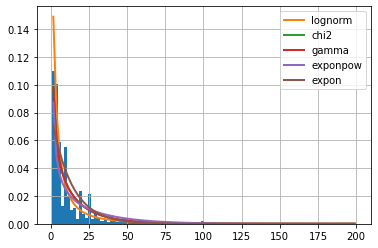

In [4]:
f = Fitter(target, distributions=get_common_distributions())
f.fit()
f.summary()
f.get_best(method="sumsquare_error")

In [5]:
f = Fitter(target, distributions=["expon"])
f.fit()
f.get_best(method="sumsquare_error")

2022-12-27 16:40:07,086 - root - INFO - Fitted expon distribution with error=0.005817423095994027)


{'expon': {'loc': 0.7111997010807082, 'scale': 13.099475669255963}}

# Simulations:

All users:
* Data conversion rate ~ 2%
* Data shape           ~ 1.5 
* Data location        ~ 0.7
* Data scale           ~ 5.0

Repeat spenders only:
* Data conversion rate ~ 20%
* Data shape           ~ 1.5
* Data location        ~ 0.7
* Data scale           ~ 5.3

E(n_users/day) = 50k, 35k per class / day

In [6]:
def get_data(
    n_daily_users: int,
    split_ratio: int,
    n_days: int
) -> pd.DataFrame:
    n_letters = int(np.ceil(math.log(n_daily_users, 26)))
    user_ids = ["".join(i) for i in product(ascii_lowercase, repeat=n_letters)][
        0:n_daily_users
    ]
    test_grs = choices(
        ["c", "p"], weights=[split_ratio, 1 - split_ratio], k=n_daily_users
    )
    meta_dts = [[x] * n_daily_users for x in range(1, n_days + 1)]
    meta_dts = [item for sublist in meta_dts for item in sublist]

    d = {
        "user_id": np.array(user_ids * n_days),
        "meta_date": np.array(meta_dts),
        "test_group": np.array(test_grs * n_days),
        "total_wins_spend": np.array([0] * n_daily_users * n_days),
    }
    df = pd.DataFrame(data=d)
    return df

## Set up for simulations - Log Normal:

In [7]:
def eval_data(
    p_all: int,
    p_rep: int,
    shape: int,
    loc: int,
    scale: int,
    con_multi: int,
    rev_multi: int,
    n_daily_users: int,
    split_ratio: int,
    n_days: int,
    stop_rule_con: int,
    stop_rule_rev: int,
    trial: int,
    verbose: bool = False,
) -> list:
    df = get_data(n_daily_users=n_daily_users, split_ratio=split_ratio, n_days=n_days)

    temp_key = list(df.user_id[0:n_daily_users])
    temp_val = [0] * n_daily_users
    spenders = dict(zip(temp_key, temp_val))

    con_results = []
    rev_results = []
    
    get_freq_stats = True
    for day in range(1, n_days + 1):
        for user_on_day in range(0, n_daily_users):
            temp_row_num = user_on_day + (day - 1) * n_daily_users
            temp_row = df.loc[temp_row_num]

            if spenders[temp_row.user_id] == 0:
                if temp_row.test_group == "c":
                    temp_spend = choices([1, 0], weights=[p_all, 1 - p_all], k=1)[0]
                else:
                    temp_spend = choices(
                        [1, 0],
                        weights=[p_all * con_multi, 1 - (p_all * con_multi)],
                        k=1,
                    )[0]
            elif spenders[temp_row.user_id] == 1:
                if temp_row.test_group == "c":
                    temp_spend = choices([1, 0], weights=[p_rep, 1 - p_rep], k=1)[0]
                else:
                    temp_spend = choices(
                        [1, 0],
                        weights=[p_rep * con_multi, 1 - (p_rep * con_multi)],
                        k=1,
                    )[0]
            else:
                print("Error 1")

            if temp_spend == 1:
                spenders[temp_row.user_id] = 1
                if temp_row.test_group == "c":
                    df.at[temp_row_num, "total_wins_spend"] = stats.lognorm.rvs(
                        shape, loc, scale, 1
                    )[0]
                else:
                    df.at[temp_row_num, "total_wins_spend"] = stats.lognorm.rvs(
                        shape, loc, scale * rev_multi, 1
                    )[0]

        result = ProducePredictions()
        results_con = result.produce_results_conversion(df[0 : (n_daily_users * day)])
        results_rev = result.produce_results_revenue(
            "lognorm", df[0 : (n_daily_users * day)]
        )

        if results_con[0]["variant"] == "P":
            id_p, id_c = 0, 1
        else:
            id_p, id_c = 1, 0
        con_results.append(
            [
                trial,
                day,
                results_con[id_p]["prob_being_best"],
                results_con[id_p]["expected_loss"],
                results_con[id_c]["prob_being_best"],
                results_con[id_c]["expected_loss"],
            ]
        )

        if results_rev[0]["variant"] == "P":
            id_p, id_c = 0, 1
        else:
            id_p, id_c = 1, 0
        rev_results.append(
            [
                trial,
                day,
                results_rev[id_p]["prob_being_best"],
                results_rev[id_p]["expected_loss"],
                results_rev[id_c]["prob_being_best"],
                results_rev[id_c]["expected_loss"],
            ]
        )
        
        if verbose == True:
            if day % 10 == 0:
                print("Day", day, "done,", n_days - day, "to go.")
        if day >= 7:
            if get_freq_stats == True:
                if con_multi != 1 or rev_multi != 1:
                    temp_col = df[0 : (n_daily_users * day)].total_wins_spend
                    min_sample_size = tt_ind_solve_power(
                        effect_size=np.mean(temp_col)*(2-con_multi-rev_multi)/np.std(temp_col),
                        alpha=0.1,
                        power=0.9,
                        ratio=split_ratio/(1-split_ratio),
                        alternative='two-sided'
                    )
                    min_sample_size = np.ceil(min_sample_size/n_daily_users)
                    if min_sample_size > n_days:
                        min_sample_size = None
                else:
                    min_sample_size = None
                get_freq_stats = False
            if (
                (float(results_con[id_p]["expected_loss"]) > stop_rule_con)
                + (float(results_con[id_c]["expected_loss"]) > stop_rule_con)
                + (float(results_rev[id_p]["expected_loss"]) > stop_rule_rev)
                + (float(results_rev[id_c]["expected_loss"]) > stop_rule_rev)
            ) != 0:
                what_stop = {
                    "trial":trial,
                    "day":day,
                    "con_p":(float(results_con[id_p]["expected_loss"]) > stop_rule_con),
                    "con_c":(float(results_con[id_c]["expected_loss"]) > stop_rule_con),
                    "rev_p":(float(results_rev[id_p]["expected_loss"]) > stop_rule_rev),
                    "rev_c":(float(results_rev[id_c]["expected_loss"]) > stop_rule_rev),
                    "time":False,
                }
                return [con_results, rev_results, min_sample_size, what_stop]
    what_stop = {
        "trial":trial,
        "day":day,
        "con_p":False,
        "con_c":False,
        "rev_p":False,
        "rev_c":False,
        "time":True,
    }
    return [con_results, rev_results, min_sample_size, what_stop]

## Set up for simulations - Exponential:

In [8]:
def eval_data_exp_gen(
    p_all: int,
    p_rep: int,
    loc: int,
    scale: int,
    con_multi: int,
    rev_multi: int,
    n_daily_users: int,
    split_ratio: int,
    n_days: int,
    stop_rule_con: int,
    stop_rule_rev: int,
    trial: int,
    verbose: bool = False,
) -> list:
    df = get_data(n_daily_users=n_daily_users, split_ratio=split_ratio, n_days=n_days)

    temp_key = list(df.user_id[0:n_daily_users])
    temp_val = [0] * n_daily_users
    spenders = dict(zip(temp_key, temp_val))

    con_results = []
    rev_results = []
    
    get_freq_stats = True
    for day in range(1, n_days + 1):
        for user_on_day in range(0, n_daily_users):
            temp_row_num = user_on_day + (day - 1) * n_daily_users
            temp_row = df.loc[temp_row_num]

            if spenders[temp_row.user_id] == 0:
                if temp_row.test_group == "c":
                    temp_spend = choices([1, 0], weights=[p_all, 1 - p_all], k=1)[0]
                else:
                    temp_spend = choices(
                        [1, 0],
                        weights=[p_all * con_multi, 1 - (p_all * con_multi)],
                        k=1,
                    )[0]
            elif spenders[temp_row.user_id] == 1:
                if temp_row.test_group == "c":
                    temp_spend = choices([1, 0], weights=[p_rep, 1 - p_rep], k=1)[0]
                else:
                    temp_spend = choices(
                        [1, 0],
                        weights=[p_rep * con_multi, 1 - (p_rep * con_multi)],
                        k=1,
                    )[0]
            else:
                print("Error 1")

            if temp_spend == 1:
                spenders[temp_row.user_id] = 1
                if temp_row.test_group == "c":
                    df.at[temp_row_num, "total_wins_spend"] = stats.expon.rvs(
                        loc, scale, 1
                    )[0]
                else:
                    df.at[temp_row_num, "total_wins_spend"] = stats.expon.rvs(
                        loc, scale * rev_multi, 1
                    )[0]

        result = ProducePredictions()
        results_con = result.produce_results_conversion(df[0 : (n_daily_users * day)])
        results_rev = result.produce_results_revenue(
            "lognorm", df[0 : (n_daily_users * day)]
        )

        if results_con[0]["variant"] == "P":
            id_p, id_c = 0, 1
        else:
            id_p, id_c = 1, 0
        con_results.append(
            [
                trial,
                day,
                results_con[id_p]["prob_being_best"],
                results_con[id_p]["expected_loss"],
                results_con[id_c]["prob_being_best"],
                results_con[id_c]["expected_loss"],
            ]
        )

        if results_rev[0]["variant"] == "P":
            id_p, id_c = 0, 1
        else:
            id_p, id_c = 1, 0
        rev_results.append(
            [
                trial,
                day,
                results_rev[id_p]["prob_being_best"],
                results_rev[id_p]["expected_loss"],
                results_rev[id_c]["prob_being_best"],
                results_rev[id_c]["expected_loss"],
            ]
        )
        
        if verbose == True:
            if day % 10 == 0:
                print("Day", day, "done,", n_days - day, "to go.")
        if day >= 7:
            if get_freq_stats == True:
                if con_multi != 1 or rev_multi != 1:
                    temp_col = df[0 : (n_daily_users * day)].total_wins_spend
                    min_sample_size = tt_ind_solve_power(
                        effect_size=np.mean(temp_col)*(2-con_multi-rev_multi)/np.std(temp_col),
                        alpha=0.1,
                        power=0.9,
                        ratio=split_ratio/(1-split_ratio),
                        alternative='two-sided'
                    )
                    min_sample_size = np.ceil(min_sample_size/n_daily_users)
                    if min_sample_size > n_days:
                        min_sample_size = None
                else:
                    min_sample_size = None
                get_freq_stats = False
            if (
                (float(results_con[id_p]["expected_loss"]) > stop_rule_con)
                + (float(results_con[id_c]["expected_loss"]) > stop_rule_con)
                + (float(results_rev[id_p]["expected_loss"]) > stop_rule_rev)
                + (float(results_rev[id_c]["expected_loss"]) > stop_rule_rev)
            ) != 0:
                what_stop = {
                    "trial":trial,
                    "day":day,
                    "con_p":(float(results_con[id_p]["expected_loss"]) > stop_rule_con),
                    "con_c":(float(results_con[id_c]["expected_loss"]) > stop_rule_con),
                    "rev_p":(float(results_rev[id_p]["expected_loss"]) > stop_rule_rev),
                    "rev_c":(float(results_rev[id_c]["expected_loss"]) > stop_rule_rev),
                    "time":False,
                }
                return [con_results, rev_results, min_sample_size, what_stop]
    what_stop = {
        "trial":trial,
        "day":day,
        "con_p":False,
        "con_c":False,
        "rev_p":False,
        "rev_c":False,
        "time":True,
    }
    return [con_results, rev_results, min_sample_size, what_stop]

## Set up for simulations - Uniform:

In [9]:
def eval_data_unif_gen(
    p_all: int,
    p_rep: int,
    con_multi: int,
    rev_multi: int,
    n_daily_users: int,
    split_ratio: int,
    n_days: int,
    stop_rule_con: int,
    stop_rule_rev: int,
    trial: int,
    verbose: bool = False,
) -> list:
    df = get_data(n_daily_users=n_daily_users, split_ratio=split_ratio, n_days=n_days)

    temp_key = list(df.user_id[0:n_daily_users])
    temp_val = [0] * n_daily_users
    spenders = dict(zip(temp_key, temp_val))

    con_results = []
    rev_results = []
    
    get_freq_stats = True
    for day in range(1, n_days + 1):
        for user_on_day in range(0, n_daily_users):
            temp_row_num = user_on_day + (day - 1) * n_daily_users
            temp_row = df.loc[temp_row_num]

            if spenders[temp_row.user_id] == 0:
                if temp_row.test_group == "c":
                    temp_spend = choices([1, 0], weights=[p_all, 1 - p_all], k=1)[0]
                else:
                    temp_spend = choices(
                        [1, 0],
                        weights=[p_all * con_multi, 1 - (p_all * con_multi)],
                        k=1,
                    )[0]
            elif spenders[temp_row.user_id] == 1:
                if temp_row.test_group == "c":
                    temp_spend = choices(
                        [1, 0], 
                        weights=[p_rep, 1 - p_rep],
                        k=1
                    )[0]
                else:
                    temp_spend = choices(
                        [1, 0],
                        weights=[p_rep * con_multi, 1 - (p_rep * con_multi)],
                        k=1,
                    )[0]
            else:
                print("Error 1")

            if temp_spend == 1:
                spenders[temp_row.user_id] = 1
                if temp_row.test_group == "c":
                    df.at[temp_row_num, "total_wins_spend"] = choices(
                        [10, 25, 100],
                        weights=[1/3, 1/3, 1/3],
                        k=1
                    )[0]
                else:
                    df.at[temp_row_num, "total_wins_spend"] = choices(
                        [x * rev_multi for x in [10, 25, 100]],
                        weights=[1/3, 1/3, 1/3],
                        k=1
                    )[0]

        result = ProducePredictions()
        results_con = result.produce_results_conversion(df[0 : (n_daily_users * day)])
        results_rev = result.produce_results_revenue(
            "lognorm", df[0 : (n_daily_users * day)]
        )

        if results_con[0]["variant"] == "P":
            id_p, id_c = 0, 1
        else:
            id_p, id_c = 1, 0
        con_results.append(
            [
                trial,
                day,
                results_con[id_p]["prob_being_best"],
                results_con[id_p]["expected_loss"],
                results_con[id_c]["prob_being_best"],
                results_con[id_c]["expected_loss"],
            ]
        )

        if results_rev[0]["variant"] == "P":
            id_p, id_c = 0, 1
        else:
            id_p, id_c = 1, 0
        rev_results.append(
            [
                trial,
                day,
                results_rev[id_p]["prob_being_best"],
                results_rev[id_p]["expected_loss"],
                results_rev[id_c]["prob_being_best"],
                results_rev[id_c]["expected_loss"],
            ]
        )
        
        if verbose == True:
            if day % 10 == 0:
                print("Day", day, "done,", n_days - day, "to go.")
        if day >= 7:
            if get_freq_stats == True:
                if con_multi != 1 or rev_multi != 1:
                    temp_col = df[0 : (n_daily_users * day)].total_wins_spend
                    min_sample_size = tt_ind_solve_power(
                        effect_size=np.mean(temp_col)*(2-con_multi-rev_multi)/np.std(temp_col),
                        alpha=0.1,
                        power=0.9,
                        ratio=split_ratio/(1-split_ratio),
                        alternative='two-sided'
                    )
                    min_sample_size = np.ceil(min_sample_size/n_daily_users)
                    if min_sample_size > n_days:
                        min_sample_size = None
                else:
                    min_sample_size = None
                get_freq_stats = False
            if (
                (float(results_con[id_p]["expected_loss"]) > stop_rule_con)
                + (float(results_con[id_c]["expected_loss"]) > stop_rule_con)
                + (float(results_rev[id_p]["expected_loss"]) > stop_rule_rev)
                + (float(results_rev[id_c]["expected_loss"]) > stop_rule_rev)
            ) != 0:
                what_stop = {
                    "trial":trial,
                    "day":day,
                    "con_p":(float(results_con[id_p]["expected_loss"]) > stop_rule_con),
                    "con_c":(float(results_con[id_c]["expected_loss"]) > stop_rule_con),
                    "rev_p":(float(results_rev[id_p]["expected_loss"]) > stop_rule_rev),
                    "rev_c":(float(results_rev[id_c]["expected_loss"]) > stop_rule_rev),
                    "time":False,
                }
                return [con_results, rev_results, min_sample_size, what_stop]
    what_stop = {
        "trial":trial,
        "day":day,
        "con_p":False,
        "con_c":False,
        "rev_p":False,
        "rev_c":False,
        "time":True,
    }
    return [con_results, rev_results, min_sample_size, what_stop]

## Set up for simulations - Output:

In [10]:
def plot_results(
    df_res: pd.DataFrame,
    name: str,
    stop_rule: int,
    stop_freq: int,
):
    fig, axes = plt.subplots(nrows = 2, ncols = 2)
    plt.rcParams["figure.figsize"] = (20,11)

    axes[0,0].set_xticks(np.arange(0, 31, 1.0)) 
    axes[0,1].set_xticks(np.arange(0, 31, 1.0)) 
    axes[1,0].set_xticks(np.arange(0, 31, 1.0)) 
    axes[1,1].set_xticks(np.arange(0, 31, 1.0))

    df_res.pivot(index = "day", columns = "trial", values = ["prob_being_best_p"]).plot(legend=None, ax = axes[0, 0], title = "P(P>C) by Trial", linewidth = 0.5)
    axes[0,0].axhline(y = 0.5, color = 'black', linewidth = 1.5)
    
    df_res.pivot(index = "day", columns = "trial", values = ["prob_being_best_c"]).plot(legend=None, ax = axes[0, 1], title = "P(C>P) by Trial", linewidth = 0.5)
    axes[0,1].axhline(y = 0.5, color = 'black', linewidth = 1.5)
    
    df_res.pivot(index = "day", columns = "trial", values = ["expected_loss_p"]).plot(legend=None, ax = axes[1, 0], title = "E(Loss | P chosen) by Trial", linewidth = 0.5)
    axes[1,0].axhline(y = stop_rule, color = 'black', linewidth = 1.5)
    if stop_freq:
        axes[1,0].axvline(x = stop_freq, color = 'plum', linestyle = '--', linewidth = 1.5)
    
    df_res.pivot(index = "day", columns = "trial", values = ["expected_loss_c"]).plot(legend=None, ax = axes[1, 1], title = "E(Loss | C chosen) by Trial", linewidth = 0.5)
    axes[1,1].axhline(y = stop_rule, color = 'black', linewidth = 1.5)
    if stop_freq:
        axes[1,1].axvline(x = stop_freq, color = 'plum', linestyle = '--', linewidth = 1.5)
    
    temp_title = 'Results ' + name + ' Test:'
    fig.suptitle(temp_title)
    plt.show()

def get_all(
    gen_type:str,
    n_trials:int,
    stop_rule_con:float,
    stop_rule_rev:float,
    n_days:int,
    con_multi:float,
    rev_multi:float,
    verbose:bool = True
):
    con_res = pd.DataFrame(
        None,
        columns=[
            "trial",
            "day",
            "prob_being_best_p",
            "expected_loss_p",
            "prob_being_best_c",
            "expected_loss_c",
        ],
    )
    rev_res = pd.DataFrame(
        None,
        columns=[
            "trial",
            "day",
            "prob_being_best_p",
            "expected_loss_p",
            "prob_being_best_c",
            "expected_loss_c",
        ],
    )
    stop_res = pd.DataFrame(
        None,
        columns=[
            "trial",
            "day",
            "con_p",
            "con_c",
            "rev_p",
            "rev_c",
            "time",
        ],
    )

    for trial in range(0, n_trials):
        if gen_type == 'log':
            temp_trial = eval_data(
                p_all=0.02,
                p_rep=0.2,
                shape=1.5,
                loc=0.7,
                scale=5.0,
                con_multi=con_multi,
                rev_multi=rev_multi,
                n_daily_users=10000,
                split_ratio=0.5,
                n_days=n_days,
                stop_rule_con=stop_rule_con,
                stop_rule_rev=stop_rule_rev,
                trial=trial,
                verbose=False,
            )
        elif gen_type == 'exp':
            temp_trial = eval_data_exp_gen(
                p_all=0.02,
                p_rep=0.2,
                loc=0.7,
                scale=13,
                con_multi=con_multi,
                rev_multi=rev_multi,
                n_daily_users=10000,
                split_ratio=0.5,
                n_days=n_days,
                stop_rule_con=stop_rule_con,
                stop_rule_rev=stop_rule_rev,
                trial=trial,
                verbose=False,
            )
        elif gen_type == 'unif':
            temp_trial = eval_data_unif_gen(
                p_all=0.02,
                p_rep=0.2,
                con_multi=con_multi,
                rev_multi=rev_multi,
                n_daily_users=10000,
                split_ratio=0.5,
                n_days=n_days,
                stop_rule_con=stop_rule_con,
                stop_rule_rev=stop_rule_rev,
                trial=trial,
                verbose=False,
            )
        else:
            return("Worng gen_type")
        
        temp_con_res = pd.DataFrame(
            temp_trial[0],
            columns=[
                "trial",
                "day",
                "prob_being_best_p",
                "expected_loss_p",
                "prob_being_best_c",
                "expected_loss_c",
            ],
        )
        temp_rev_res = pd.DataFrame(
            temp_trial[1],
            columns=[
                "trial",
                "day",
                "prob_being_best_p",
                "expected_loss_p",
                "prob_being_best_c",
                "expected_loss_c",
            ],
        )
        temp_stop_res = pd.DataFrame(
            temp_trial[3],
            columns=[
                "trial",
                "day",
                "con_p",
                "con_c",
                "rev_p",
                "rev_c",
                "time",
            ],
            index = [trial],
        )
        
        con_res = pd.concat([con_res, temp_con_res], ignore_index=True)
        rev_res = pd.concat([rev_res, temp_rev_res], ignore_index=True)
        stop_res = pd.concat([stop_res, temp_stop_res], ignore_index=True)
        
        if verbose == True:
            if trial % 5 == 0:
                print("Trial" , str(trial) + "/" + str(n_trials))
    
    return([con_res, rev_res, stop_res, temp_trial[2]])

# No Uplift Tests:

### Log Normal:

In [43]:
# No Uplift on Conversion:
# No Uplift on Revenue:
log_c_nU_nU = get_all(
    gen_type = "log",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1,
    rev_multi = 1,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


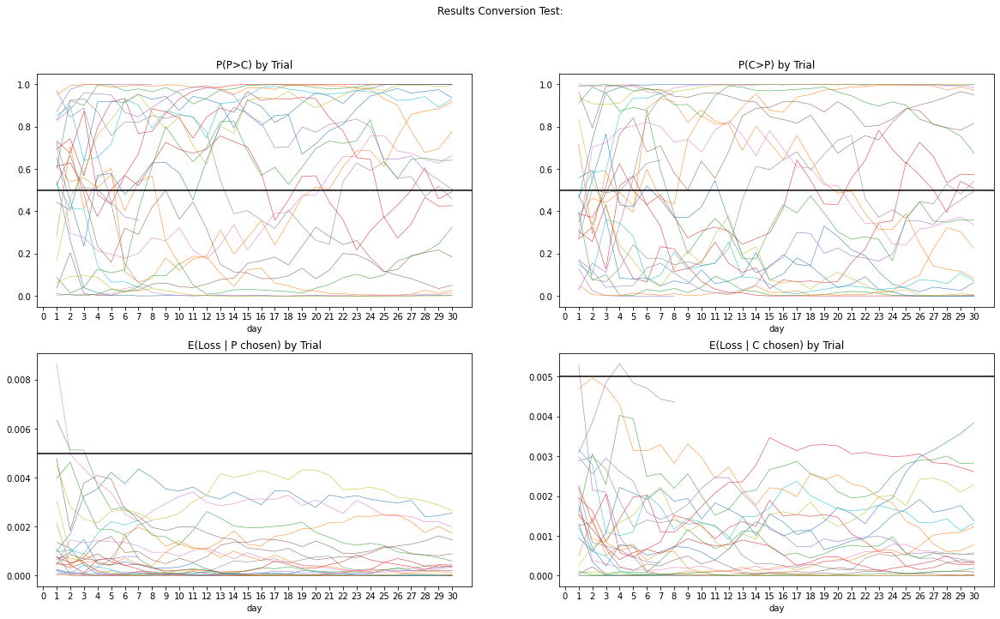

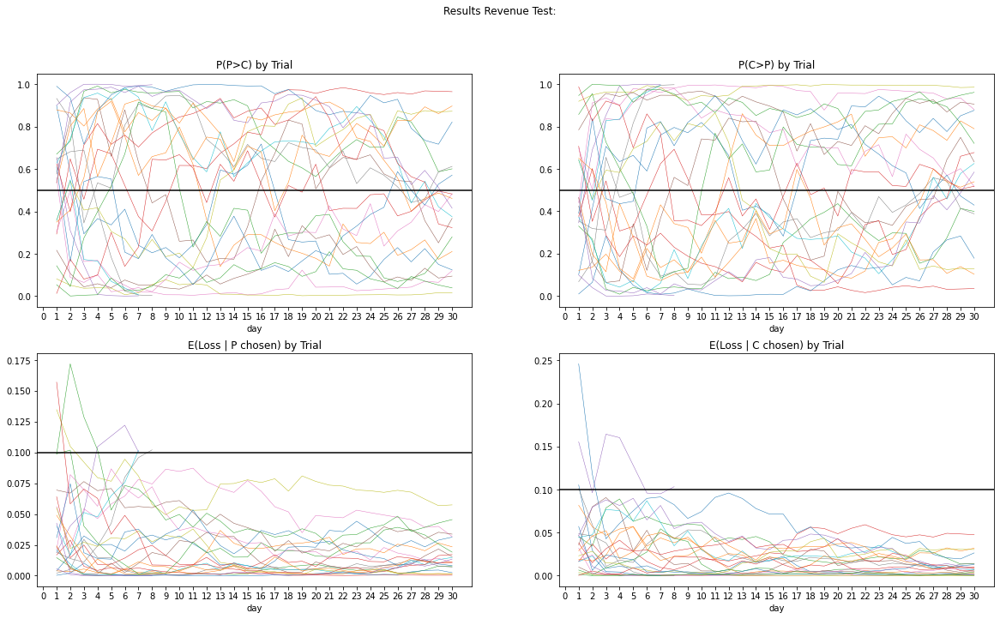

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,30,False,False,False,False,True
1,1,30,False,False,False,False,True
2,2,30,False,False,False,False,True
3,3,30,False,False,False,False,True
4,4,7,False,False,True,False,False
5,5,30,False,False,False,False,True
6,6,30,False,False,False,False,True
7,7,30,False,False,False,False,True
8,8,30,False,False,False,False,True
9,9,30,False,False,False,False,True


In [44]:
plot_results(log_c_nU_nU[0], "Conversion", 0.005, log_c_nU_nU[3])
plot_results(log_c_nU_nU[1], "Revenue", 0.1, log_c_nU_nU[3])
log_c_nU_nU[2]

#out = n_stops(con_res, n_days)
#print("Number concluded as sig. high revenue:", round(sum(out)/len(out) * 100, 2), "%")

### Exponential:

In [45]:
# No Uplift on Conversion:
# No Uplift on Revenue:
exp_c_nU_nU = get_all(
    gen_type = "exp",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1,
    rev_multi = 1,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


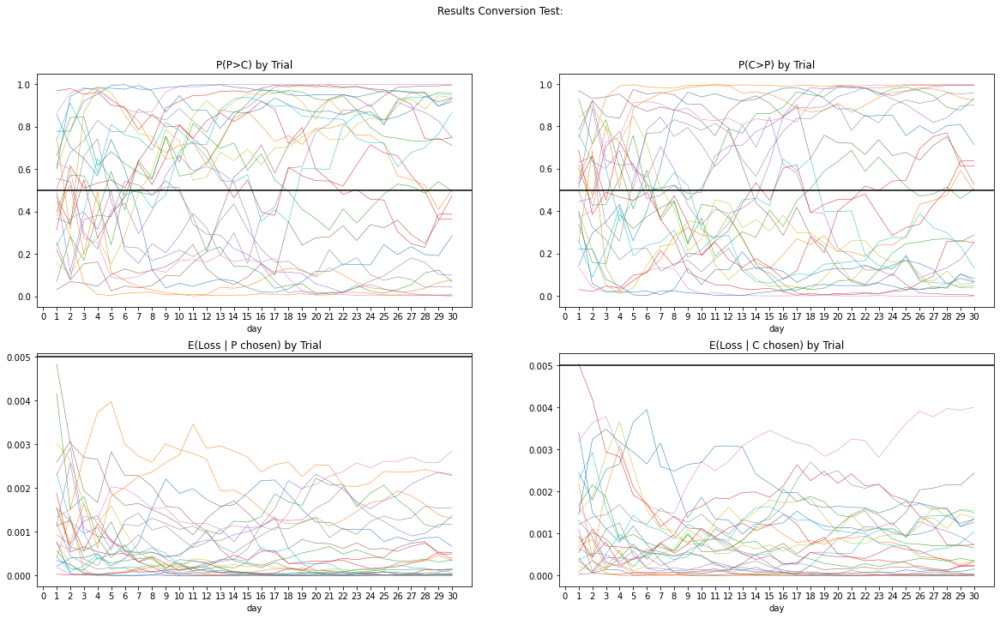

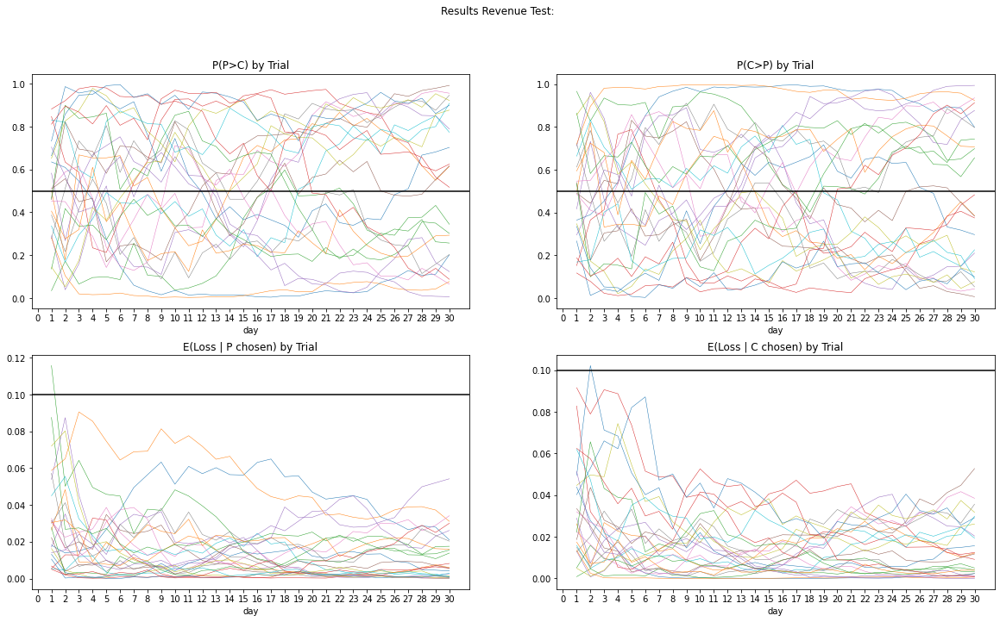

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,30,False,False,False,False,True
1,1,30,False,False,False,False,True
2,2,30,False,False,False,False,True
3,3,30,False,False,False,False,True
4,4,30,False,False,False,False,True
5,5,30,False,False,False,False,True
6,6,30,False,False,False,False,True
7,7,30,False,False,False,False,True
8,8,30,False,False,False,False,True
9,9,30,False,False,False,False,True


In [46]:
plot_results(exp_c_nU_nU[0], "Conversion", 0.005, exp_c_nU_nU[3])
plot_results(exp_c_nU_nU[1], "Revenue", 0.1, exp_c_nU_nU[3])
exp_c_nU_nU[2]

### Uniform:

In [10]:
# No Uplift on Conversion:
# No Uplift on Revenue:
unif_c_nU_nU = get_all(
    gen_type = "unif",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1,
    rev_multi = 1,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


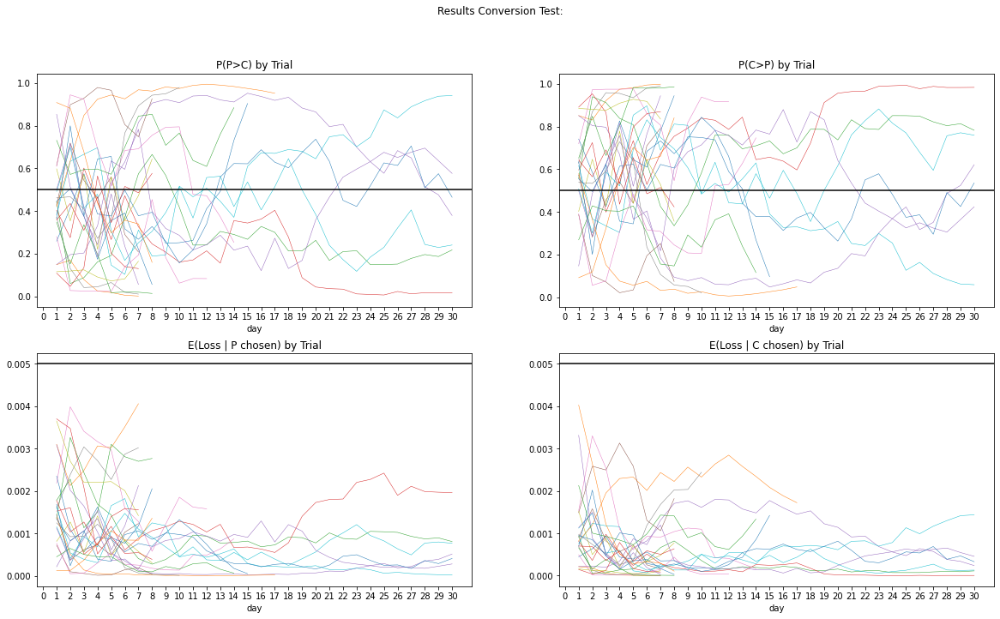

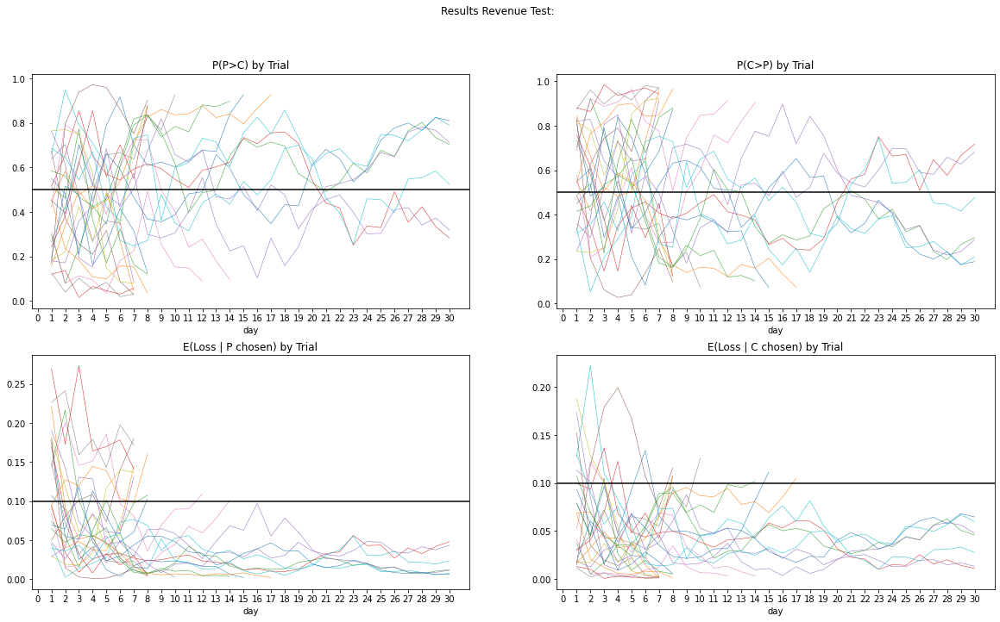

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,15,False,False,False,True,False
1,1,7,False,False,True,False,False
2,2,30,False,False,False,False,True
3,3,30,False,False,False,False,True
4,4,30,False,False,False,False,True
5,5,7,False,False,True,False,False
6,6,12,False,False,True,False,False
7,7,7,False,False,True,False,False
8,8,8,False,False,False,True,False
9,9,30,False,False,False,False,True


In [12]:
plot_results(unif_c_nU_nU[0], "Conversion", 0.005, unif_c_nU_nU[3])
plot_results(unif_c_nU_nU[1], "Revenue", 0.1, unif_c_nU_nU[3])
unif_c_nU_nU[2]

# Conversion Uplift Tests:

### Log Normal - 5%, 10% & 20% Uplift:

In [212]:
# 5% Uplift on Conversion:
# No Uplift on Revenue:
log_c_yU_nU_1 = get_all(
    gen_type = "log",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1.05,
    rev_multi = 1,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


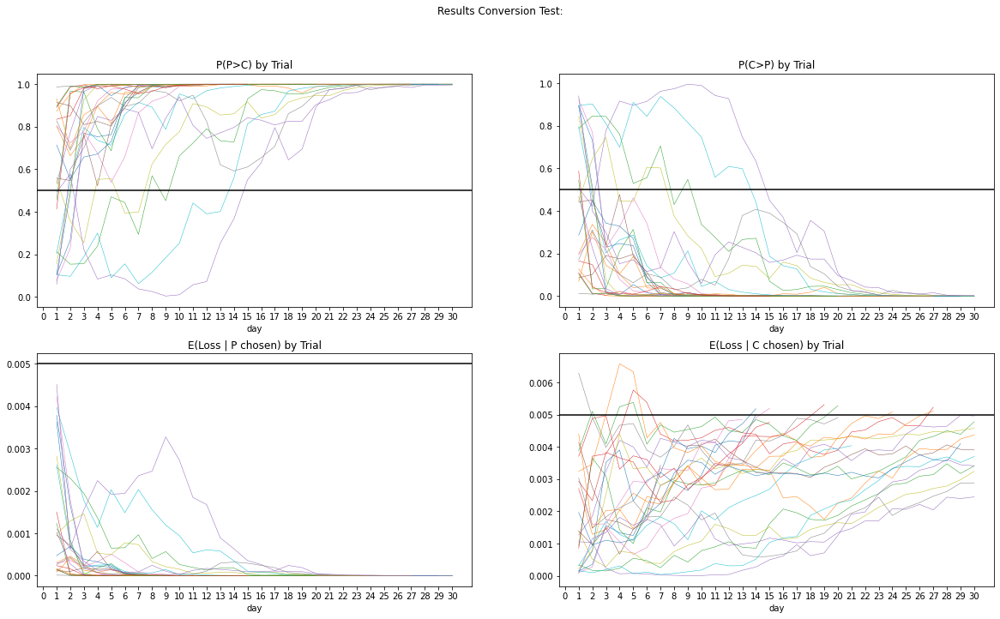

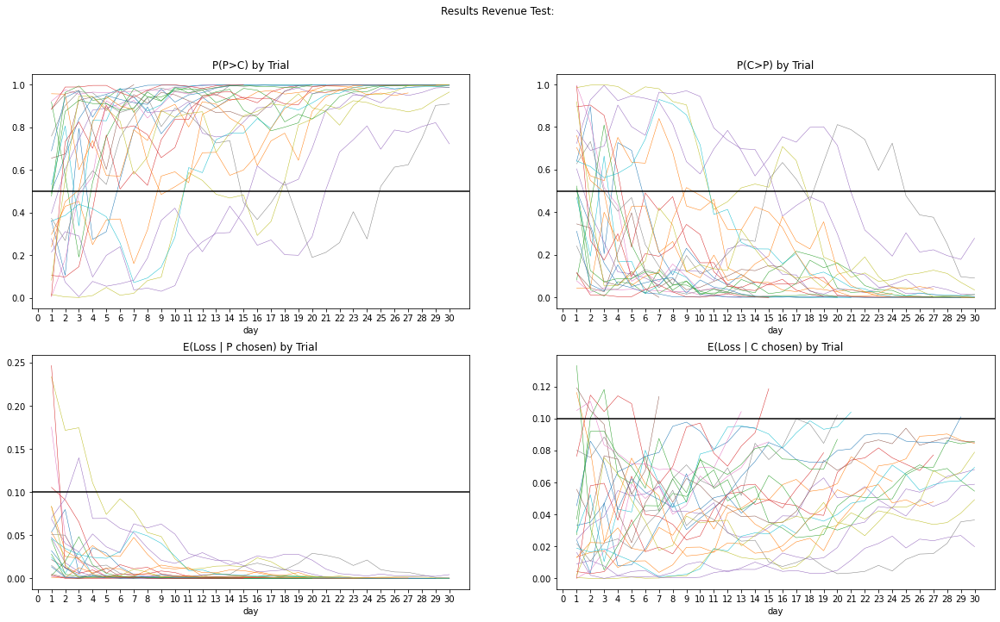

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,14,False,True,False,False,False
1,1,24,False,True,False,False,False
2,2,30,False,False,False,False,True
3,3,27,False,True,False,False,False
4,4,30,False,False,False,False,True
5,5,7,False,False,False,True,False
6,6,15,False,True,False,False,False
7,7,20,False,False,False,True,False
8,8,30,False,False,False,False,True
9,9,21,False,False,False,True,False


In [213]:
plot_results(log_c_yU_nU_1[0], "Conversion", 0.005, log_c_yU_nU_1[3])
plot_results(log_c_yU_nU_1[1], "Revenue", 0.1, log_c_yU_nU_1[3])
log_c_yU_nU_1[2]

In [214]:
# 10% Uplift on Conversion:
# No Uplift on Revenue:
log_c_yU_nU_2 = get_all(
    gen_type = "log",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1.1,
    rev_multi = 1,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


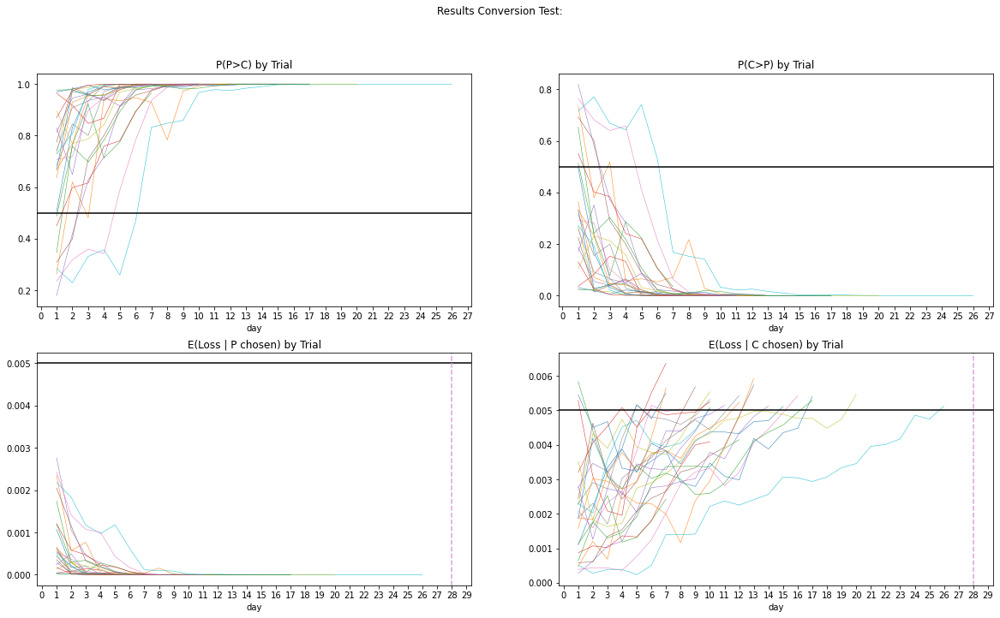

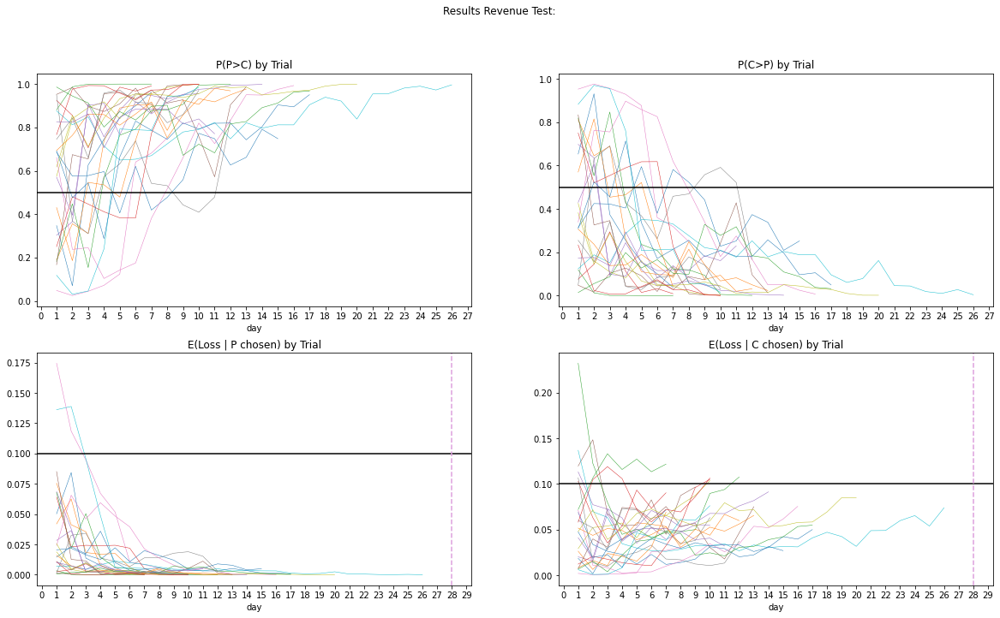

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,7,False,True,False,False,False
1,1,13,False,True,False,False,False
2,2,7,False,False,False,True,False
3,3,7,False,True,False,False,False
4,4,14,False,True,False,False,False
5,5,9,False,True,False,False,False
6,6,8,False,True,False,False,False
7,7,12,False,True,False,False,False
8,8,10,False,True,False,True,False
9,9,26,False,True,False,False,False


In [215]:
plot_results(log_c_yU_nU_2[0], "Conversion", 0.005, log_c_yU_nU_2[3])
plot_results(log_c_yU_nU_2[1], "Revenue", 0.1, log_c_yU_nU_2[3])
log_c_yU_nU_2[2]

In [216]:
# 20% Uplift on Conversion:
# No Uplift on Revenue:
log_c_yU_nU_3 = get_all(
    gen_type = "log",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1.2,
    rev_multi = 1,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


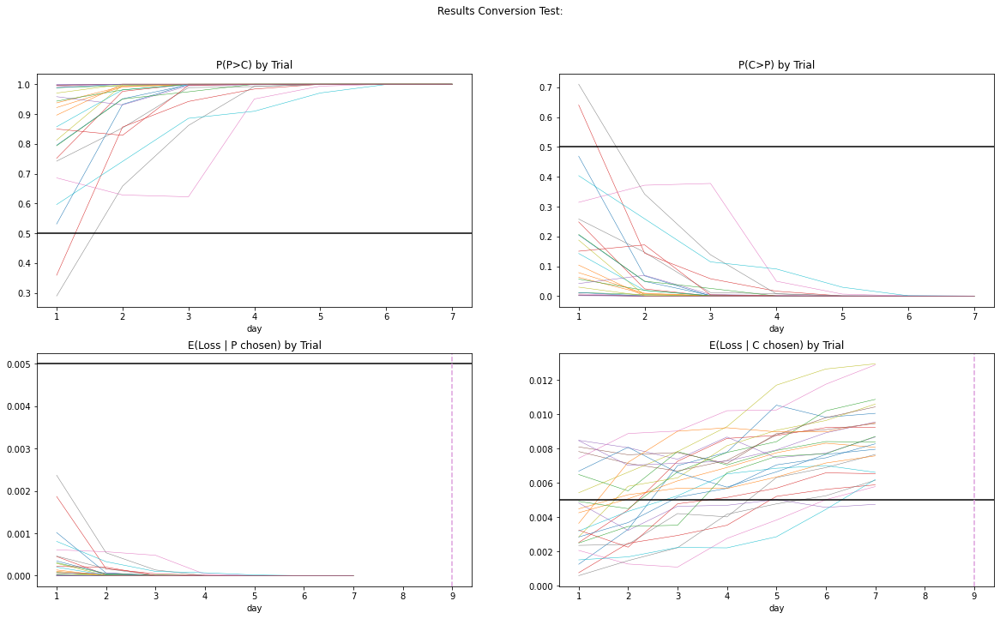

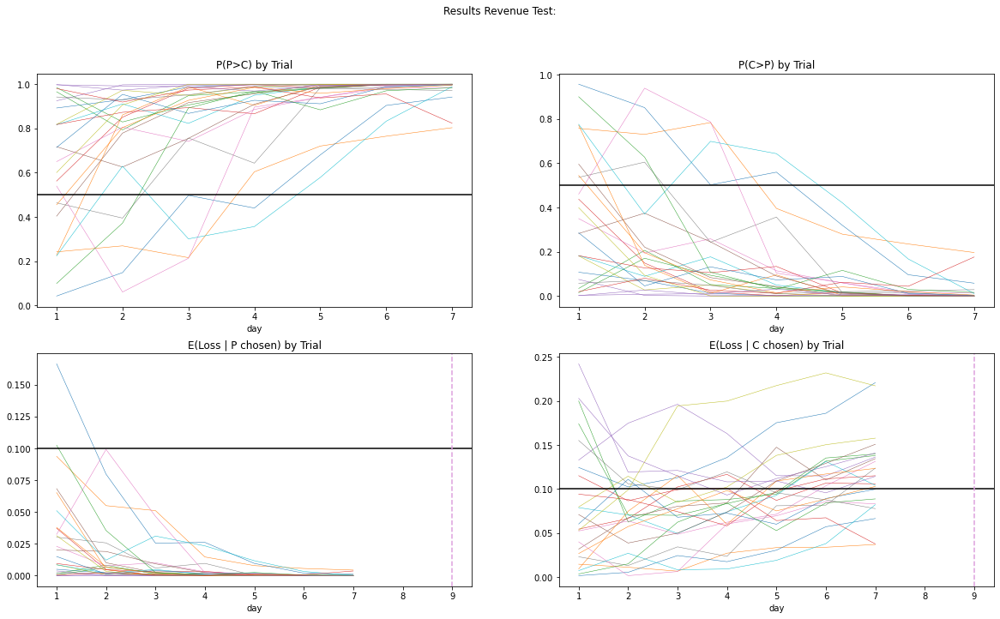

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,7,False,True,False,True,False
1,1,7,False,True,False,False,False
2,2,7,False,True,False,True,False
3,3,7,False,True,False,True,False
4,4,7,False,True,False,True,False
5,5,7,False,True,False,True,False
6,6,7,False,True,False,True,False
7,7,7,False,True,False,True,False
8,8,7,False,True,False,True,False
9,9,7,False,True,False,True,False


In [217]:
plot_results(log_c_yU_nU_3[0], "Conversion", 0.005, log_c_yU_nU_3[3])
plot_results(log_c_yU_nU_3[1], "Revenue", 0.1, log_c_yU_nU_3[3])
log_c_yU_nU_3[2]

### Exponential Data - 5% & 10% Uplift:

In [10]:
# 5% Uplift on Conversion:
# No Uplift on Revenue:
exp_c_yU_nU_1 = get_all(
    gen_type = "exp",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1.05,
    rev_multi = 1,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


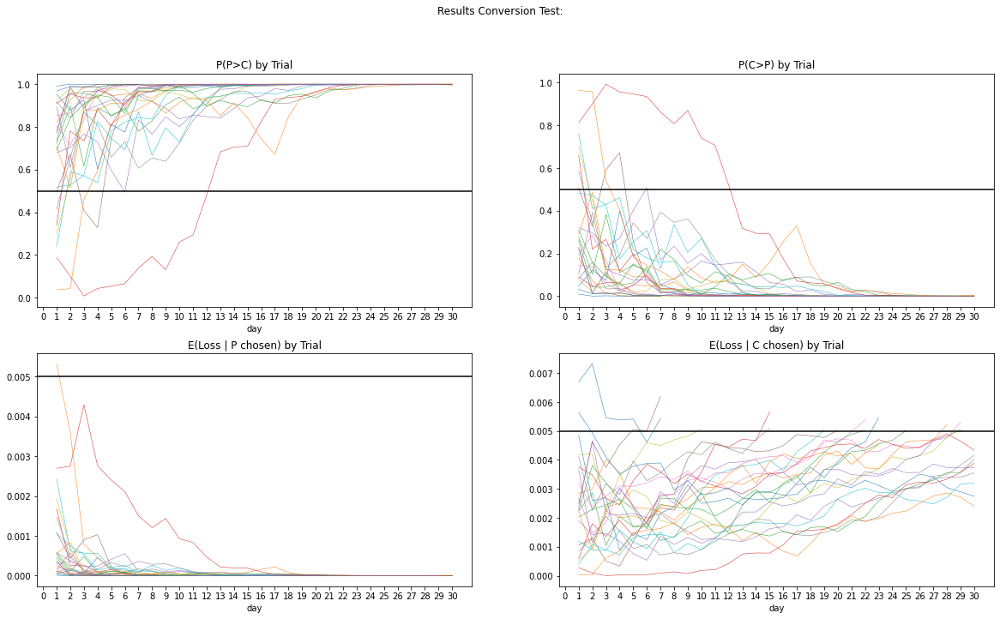

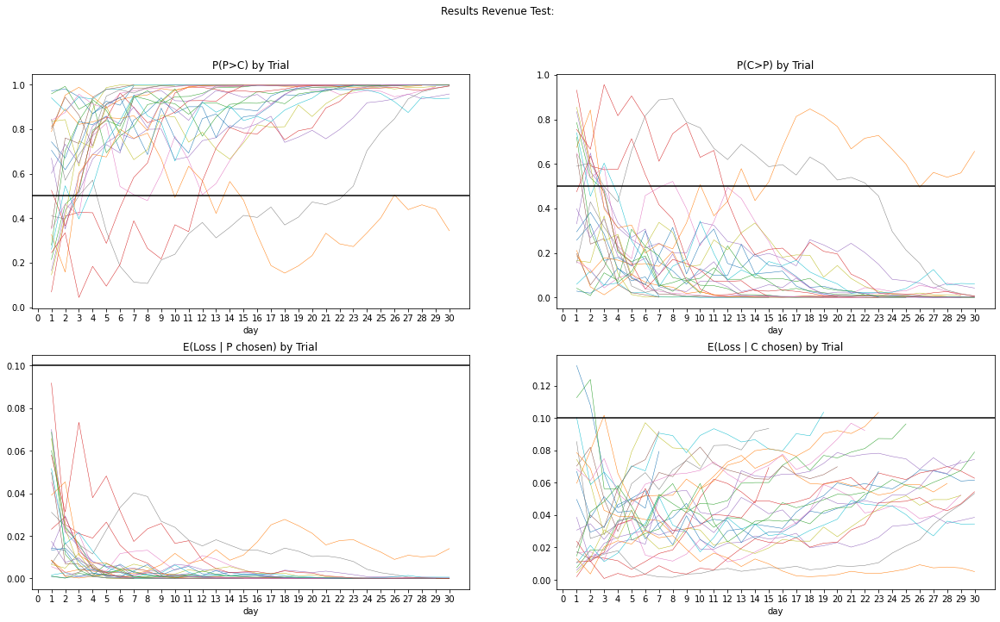

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,7,False,True,False,False,False
1,1,28,False,True,False,False,False
2,2,25,False,True,False,False,False
3,3,15,False,True,False,False,False
4,4,30,False,False,False,False,True
5,5,20,False,True,False,False,False
6,6,29,False,True,False,False,False
7,7,30,False,False,False,False,True
8,8,10,False,True,False,False,False
9,9,19,False,True,False,True,False


In [11]:
plot_results(exp_c_yU_nU_1[0], "Conversion", 0.005, exp_c_yU_nU_1[3])
plot_results(exp_c_yU_nU_1[1], "Revenue", 0.1, exp_c_yU_nU_1[3])
exp_c_yU_nU_1[2]

In [12]:
# 10% Uplift on Conversion:
# No Uplift on Revenue:
exp_c_yU_nU_2 = get_all(
    gen_type = "exp",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1.1,
    rev_multi = 1,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


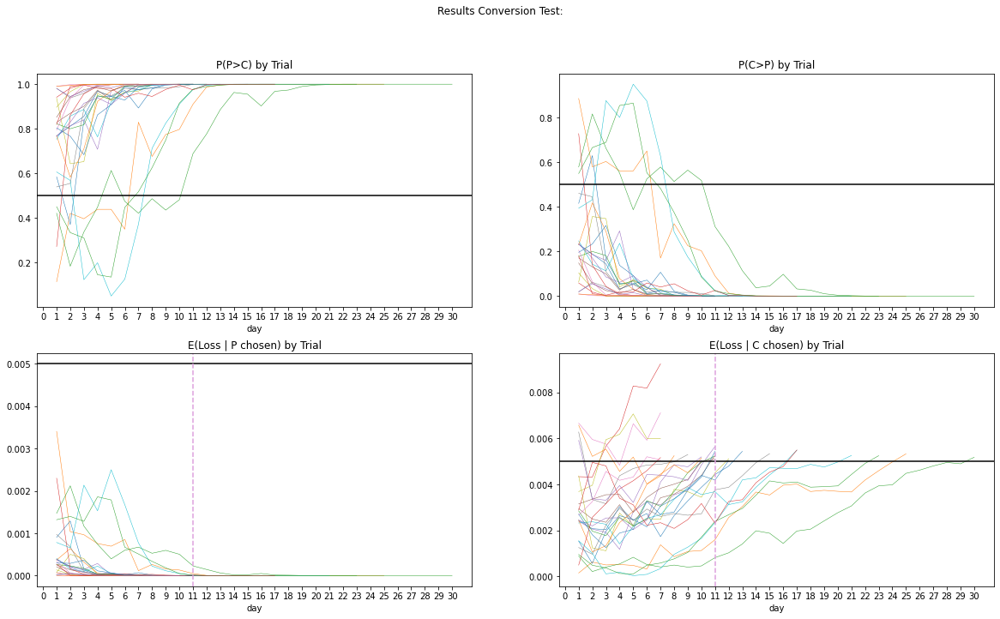

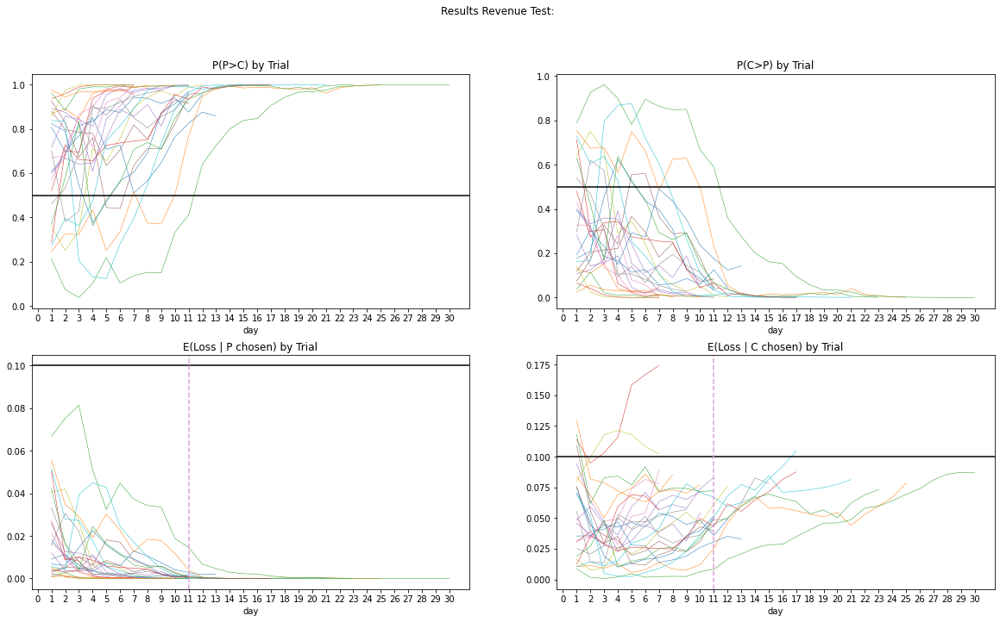

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,13,False,True,False,False,False
1,1,25,False,True,False,False,False
2,2,30,False,True,False,False,False
3,3,7,False,True,False,True,False
4,4,11,False,True,False,False,False
5,5,11,False,True,False,False,False
6,6,7,False,True,False,False,False
7,7,9,False,True,False,False,False
8,8,12,False,True,False,False,False
9,9,17,False,True,False,True,False


In [13]:
plot_results(exp_c_yU_nU_2[0], "Conversion", 0.005, exp_c_yU_nU_2[3])
plot_results(exp_c_yU_nU_2[1], "Revenue", 0.1, exp_c_yU_nU_2[3])
exp_c_yU_nU_2[2]

### Uniform Data - 5% & 10% Uplift:

In [17]:
# 5% Uplift on Conversion:
# No Uplift on Revenue:
unif_c_yU_nU_1 = get_all(
    gen_type = "unif",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1.05,
    rev_multi = 1,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


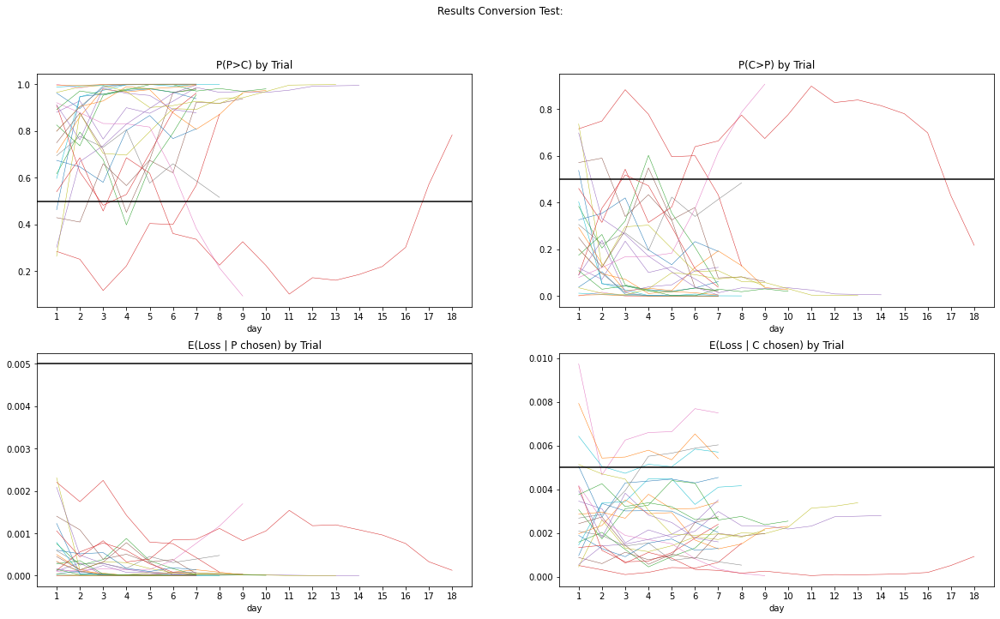

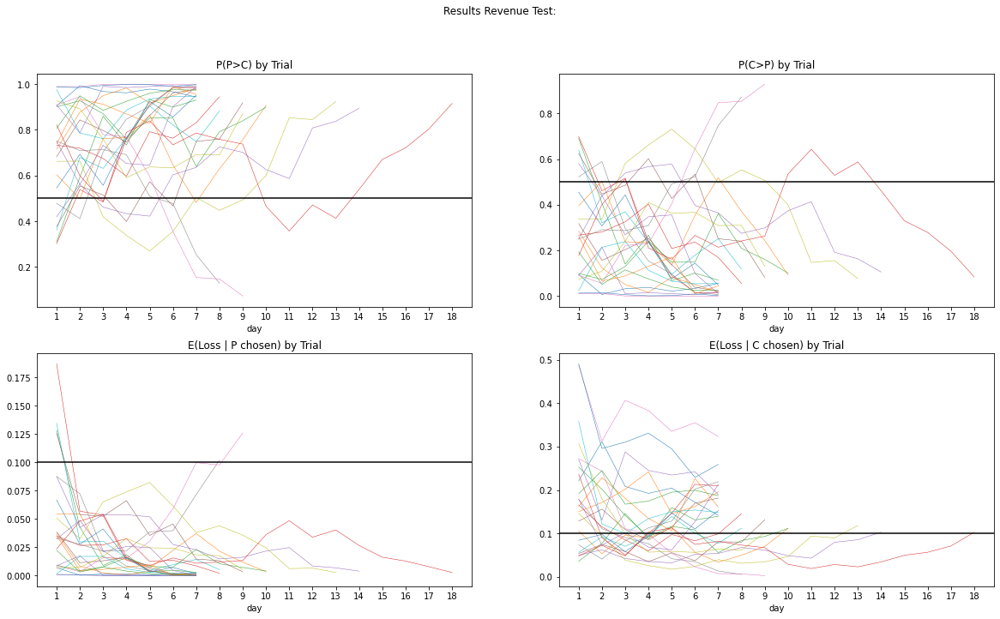

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,7,False,False,False,True,False
1,1,10,False,False,False,True,False
2,2,7,False,False,False,True,False
3,3,8,False,False,False,True,False
4,4,14,False,False,False,True,False
5,5,7,False,False,False,True,False
6,6,7,False,True,False,True,False
7,7,8,False,False,True,False,False
8,8,13,False,False,False,True,False
9,9,8,False,False,False,True,False


In [18]:
plot_results(unif_c_yU_nU_1[0], "Conversion", 0.005, unif_c_yU_nU_1[3])
plot_results(unif_c_yU_nU_1[1], "Revenue", 0.1, unif_c_yU_nU_1[3])
unif_c_yU_nU_1[2]

In [19]:
# 10% Uplift on Conversion:
# No Uplift on Revenue:
unif_c_yU_nU_2 = get_all(
    gen_type = "unif",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1.1,
    rev_multi = 1,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


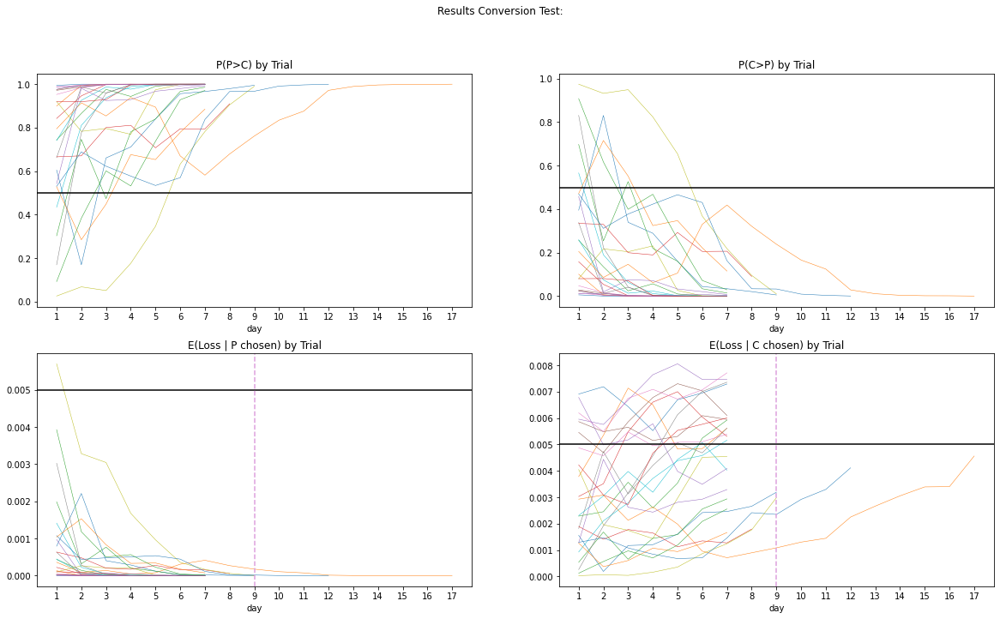

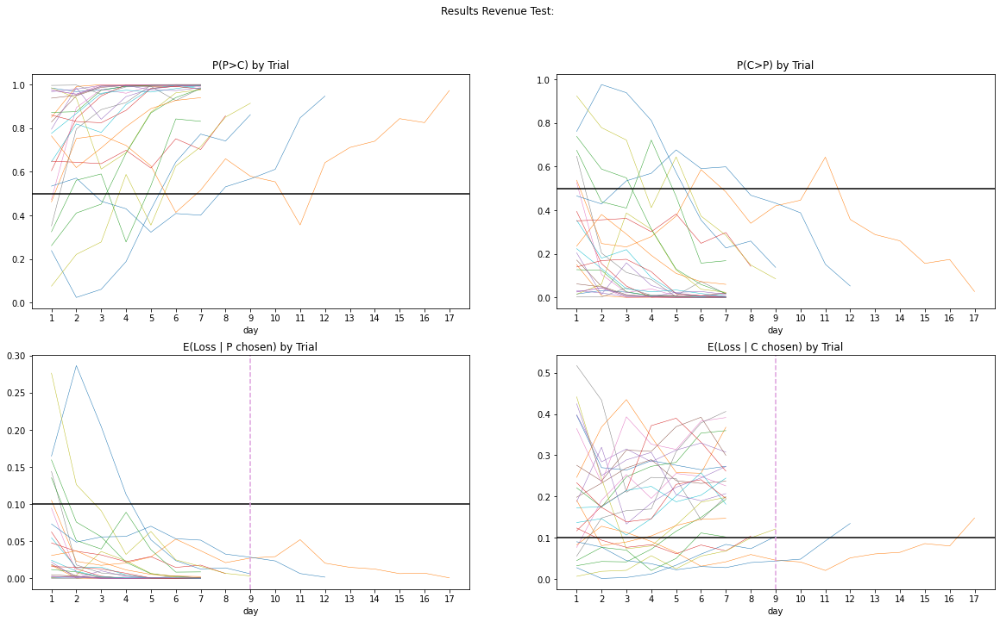

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,7,False,True,False,True,False
1,1,7,False,True,False,True,False
2,2,7,False,True,False,True,False
3,3,7,False,True,False,True,False
4,4,7,False,True,False,True,False
5,5,7,False,True,False,True,False
6,6,7,False,True,False,True,False
7,7,7,False,True,False,True,False
8,8,7,False,False,False,True,False
9,9,7,False,False,False,True,False


In [20]:
plot_results(unif_c_yU_nU_2[0], "Conversion", 0.005, unif_c_yU_nU_2[3])
plot_results(unif_c_yU_nU_2[1], "Revenue", 0.1, unif_c_yU_nU_2[3])
unif_c_yU_nU_2[2]

# Revenue Uplift Tests:

### Log Normal - 5%, 10%, 15% Uplift:

In [21]:
# No Uplift on Conversion:
# 5% Uplift on Revenue:
log_r_nU_yU_1 = get_all(
    gen_type = "log",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1,
    rev_multi = 1.05,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


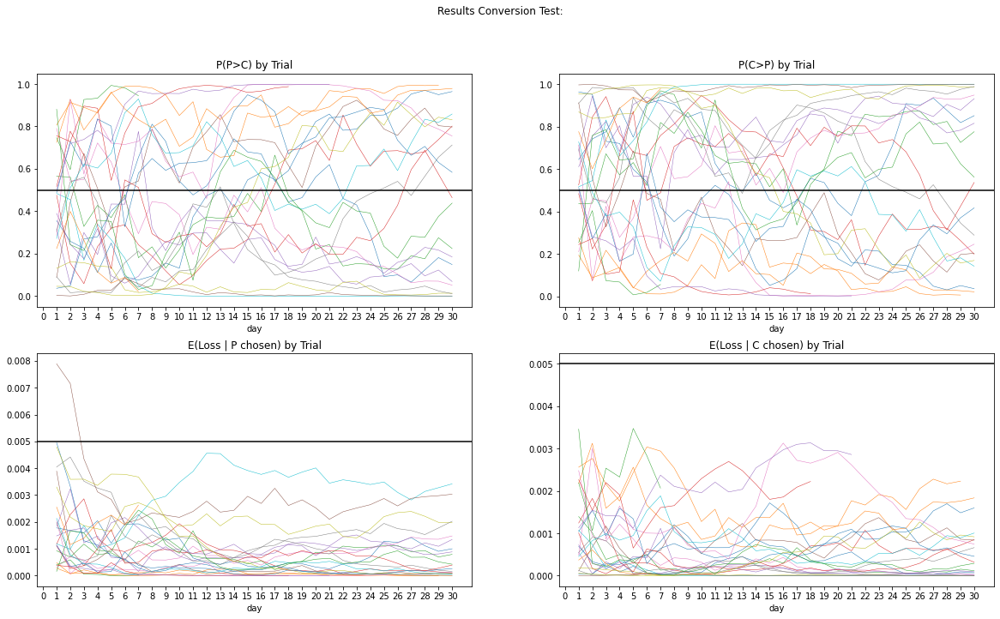

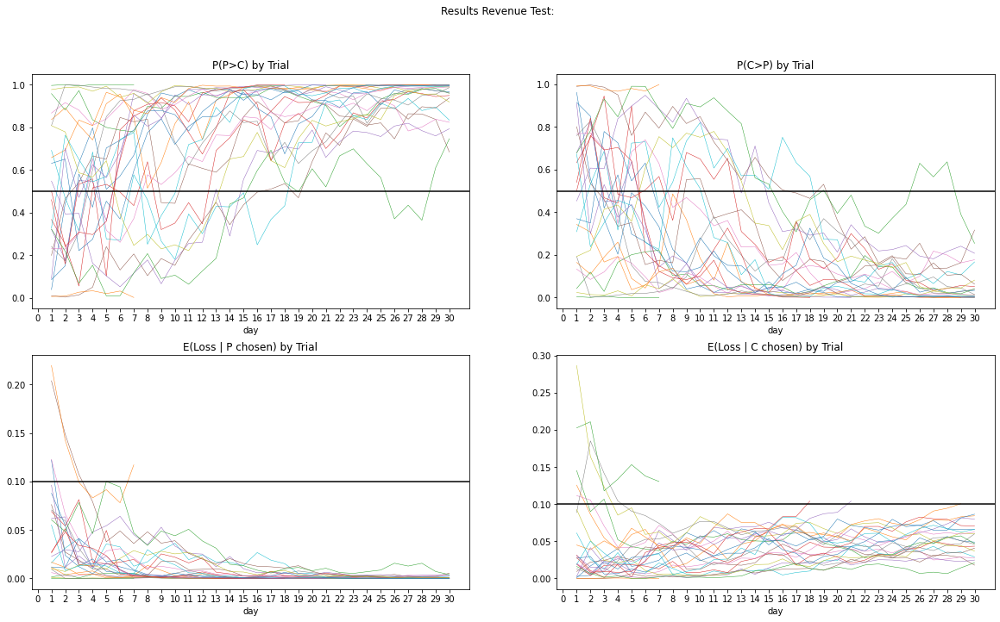

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,30,False,False,False,False,True
1,1,29,False,False,False,True,False
2,2,30,False,False,False,False,True
3,3,30,False,False,False,False,True
4,4,30,False,False,False,False,True
5,5,30,False,False,False,False,True
6,6,30,False,False,False,False,True
7,7,30,False,False,False,False,True
8,8,30,False,False,False,False,True
9,9,30,False,False,False,False,True


In [22]:
plot_results(log_r_nU_yU_1[0], "Conversion", 0.005, log_r_nU_yU_1[3])
plot_results(log_r_nU_yU_1[1], "Revenue", 0.1, log_r_nU_yU_1[3])
log_r_nU_yU_1[2]

In [23]:
# No Uplift on Conversion:
# 10% Uplift on Revenue:
log_r_nU_yU_2 = get_all(
    gen_type = "log",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1,
    rev_multi = 1.1,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


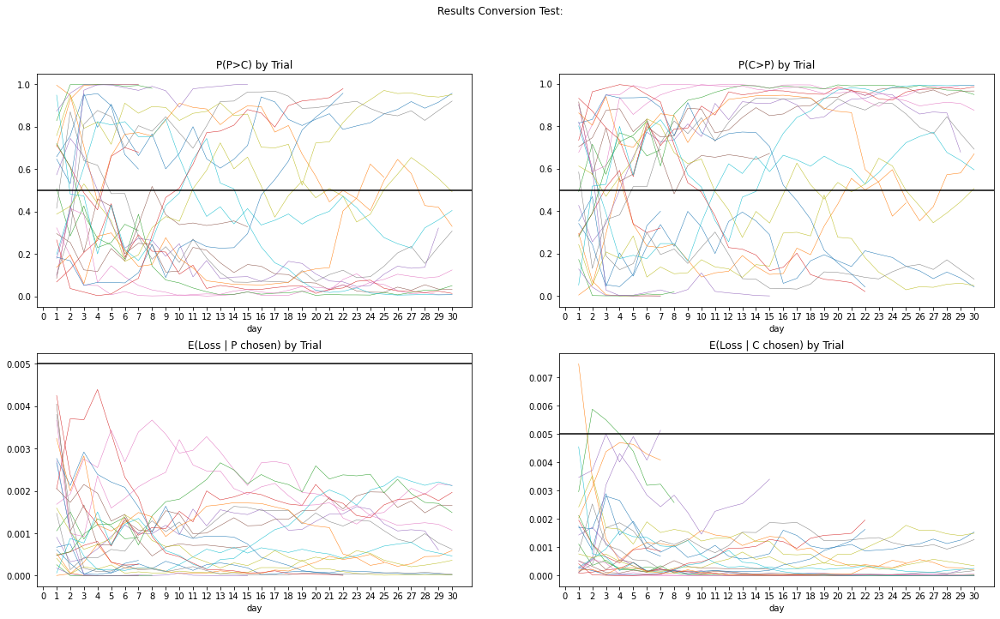

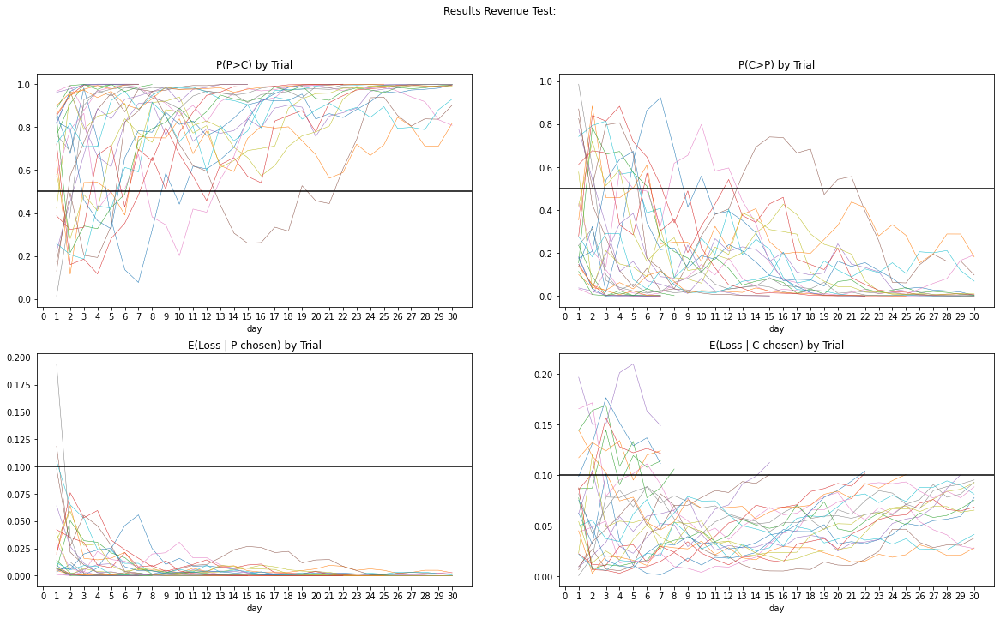

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,30,False,False,False,False,True
1,1,30,False,False,False,False,True
2,2,7,False,False,False,True,False
3,3,7,False,False,False,True,False
4,4,29,False,False,False,True,False
5,5,30,False,False,False,False,True
6,6,30,False,False,False,False,True
7,7,30,False,False,False,False,True
8,8,30,False,False,False,False,True
9,9,30,False,False,False,False,True


In [24]:
plot_results(log_r_nU_yU_2[0], "Conversion", 0.005, log_r_nU_yU_2[3])
plot_results(log_r_nU_yU_2[1], "Revenue", 0.1, log_r_nU_yU_2[3])
log_r_nU_yU_2[2]

In [11]:
# No Uplift on Conversion:
# 15% Uplift on Revenue:
log_r_nU_yU_3 = get_all(
    gen_type = "log",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1,
    rev_multi = 1.15,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


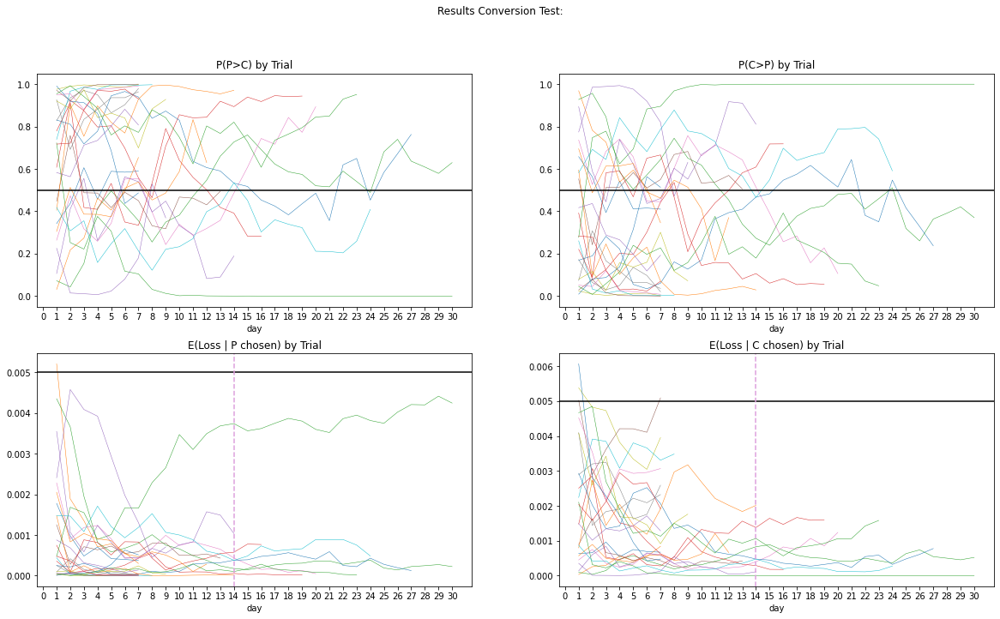

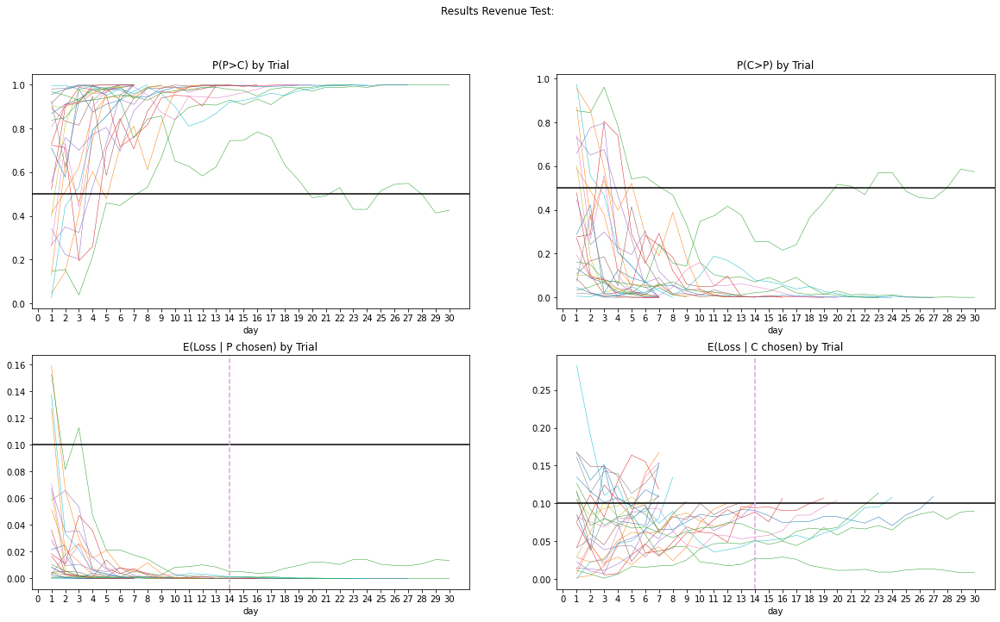

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,7,False,False,False,True,False
1,1,7,False,False,False,True,False
2,2,30,False,False,False,False,True
3,3,19,False,False,False,True,False
4,4,9,False,False,False,True,False
5,5,13,False,False,False,True,False
6,6,20,False,False,False,True,False
7,7,7,False,False,False,True,False
8,8,7,False,False,False,True,False
9,9,8,False,False,False,True,False


In [17]:
plot_results(log_r_nU_yU_3[0], "Conversion", 0.005, log_r_nU_yU_3[3])
plot_results(log_r_nU_yU_3[1], "Revenue", 0.1, log_r_nU_yU_3[3])
log_r_nU_yU_3[2]

### Exponential Data - 5%, 10%, 15% Uplift:

In [29]:
# No Uplift on Conversion:
# 5% Uplift on Revenue:
exp_r_nU_yU_1 = get_all(
    gen_type = "exp",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1,
    rev_multi = 1.05,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


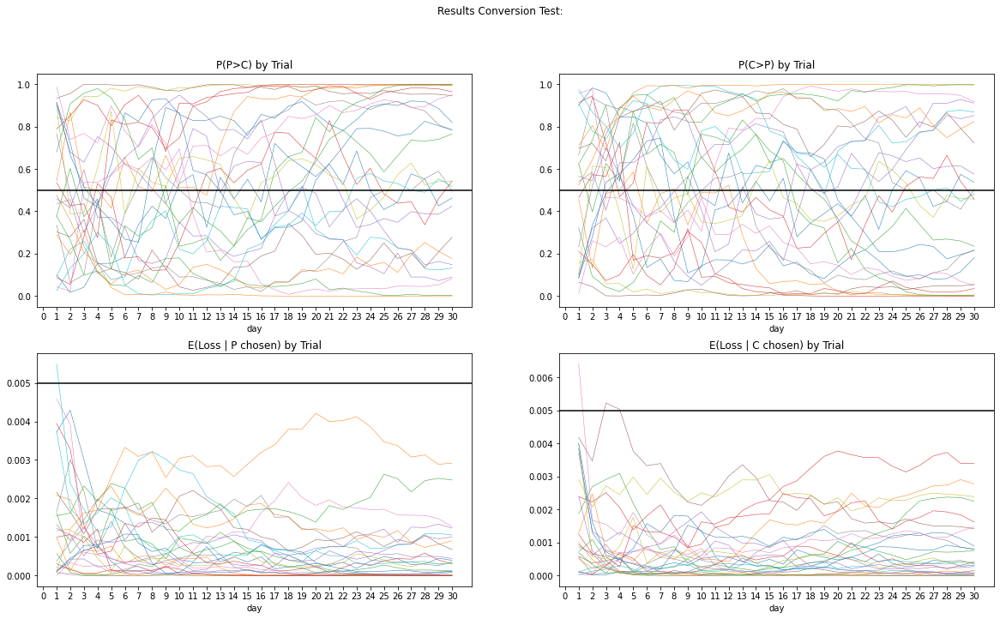

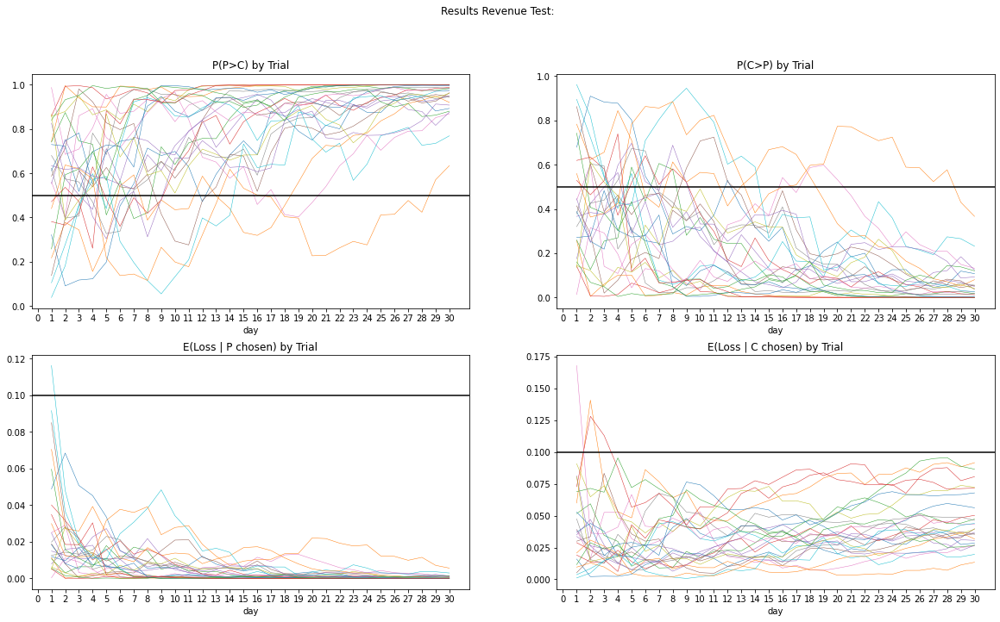

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,30,False,False,False,False,True
1,1,30,False,False,False,False,True
2,2,30,False,False,False,False,True
3,3,30,False,False,False,False,True
4,4,30,False,False,False,False,True
5,5,30,False,False,False,False,True
6,6,30,False,False,False,False,True
7,7,30,False,False,False,False,True
8,8,30,False,False,False,False,True
9,9,30,False,False,False,False,True


In [30]:
plot_results(exp_r_nU_yU_1[0], "Conversion", 0.005, exp_r_nU_yU_1[3])
plot_results(exp_r_nU_yU_1[1], "Revenue", 0.1, exp_r_nU_yU_1[3])
exp_r_nU_yU_1[2]

In [31]:
# No Uplift on Conversion:
# 10% Uplift on Revenue:
exp_r_nU_yU_2 = get_all(
    gen_type = "exp",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1,
    rev_multi = 1.1,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


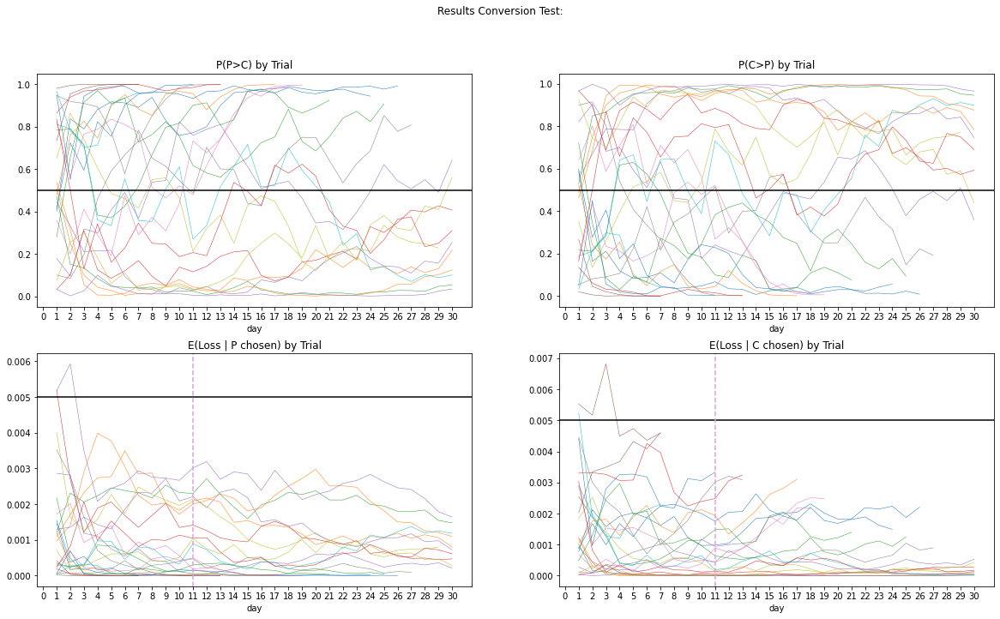

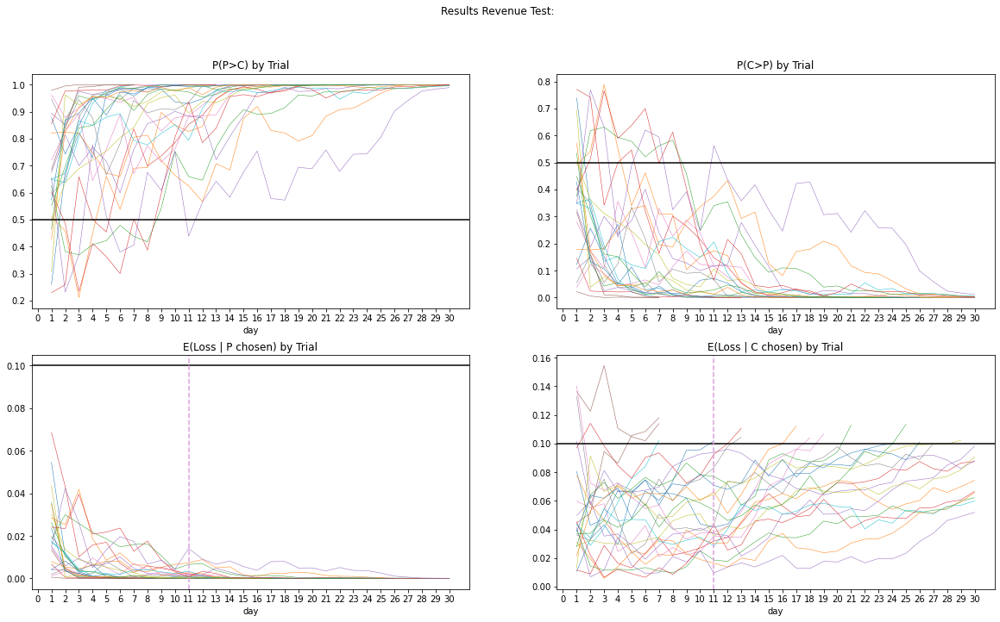

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,24,False,False,False,True,False
1,1,30,False,False,False,False,True
2,2,30,False,False,False,False,True
3,3,30,False,False,False,False,True
4,4,30,False,False,False,False,True
5,5,7,False,False,False,True,False
6,6,18,False,False,False,True,False
7,7,13,False,False,False,True,False
8,8,30,False,False,False,False,True
9,9,7,False,False,False,True,False


In [32]:
plot_results(exp_r_nU_yU_2[0], "Conversion", 0.005, exp_r_nU_yU_2[3])
plot_results(exp_r_nU_yU_2[1], "Revenue", 0.1, exp_r_nU_yU_2[3])
exp_r_nU_yU_2[2]

In [13]:
# No Uplift on Conversion:
# 15% Uplift on Revenue:
exp_r_nU_yU_3 = get_all(
    gen_type = "exp",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1,
    rev_multi = 1.15,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


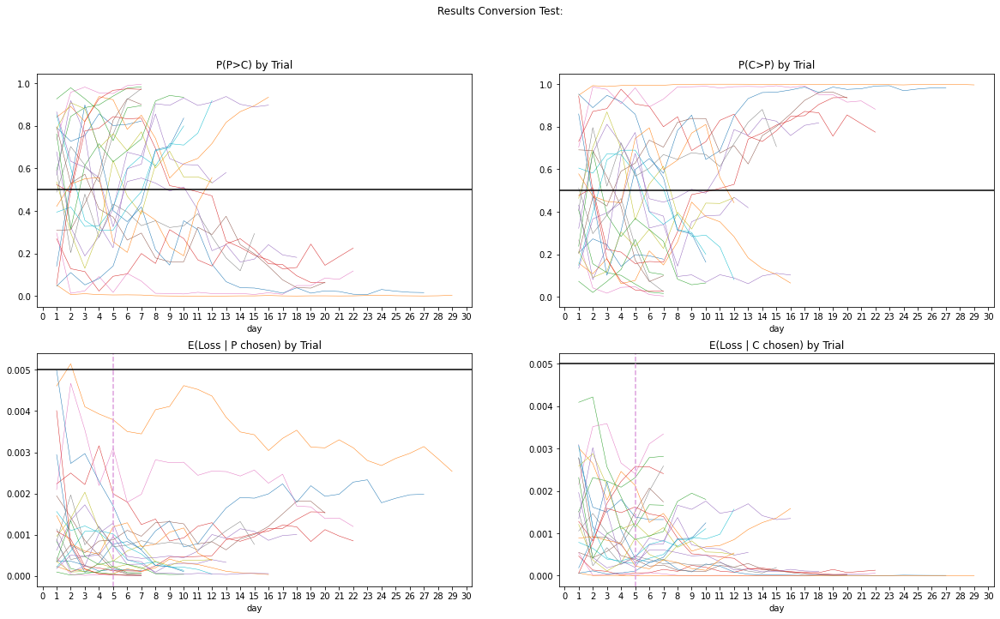

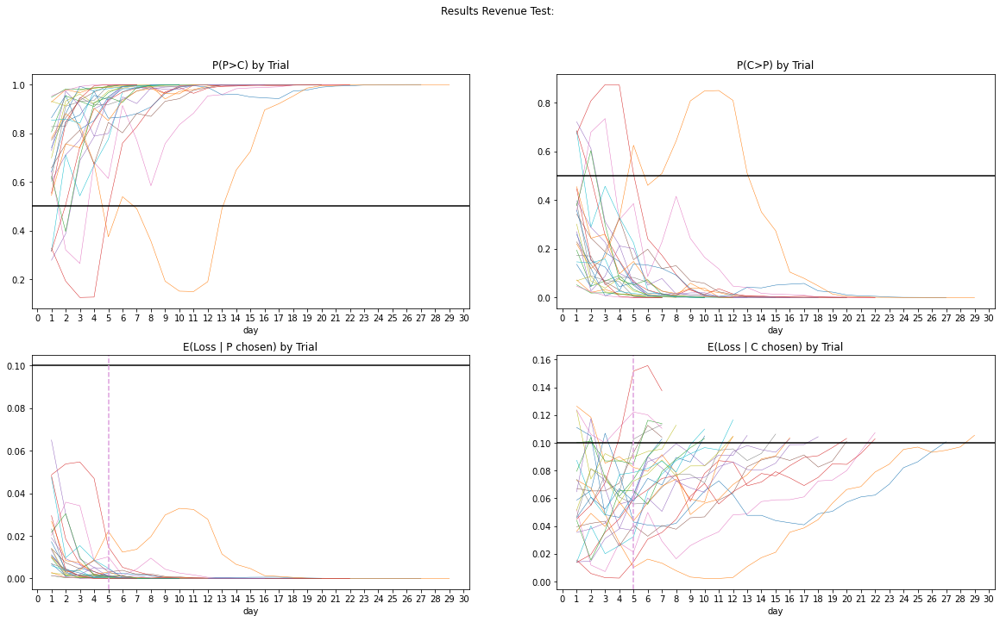

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,7,False,False,False,True,False
1,1,16,False,False,False,True,False
2,2,7,False,False,False,True,False
3,3,20,False,False,False,True,False
4,4,13,False,False,False,True,False
5,5,7,False,False,False,True,False
6,6,22,False,False,False,True,False
7,7,7,False,False,False,True,False
8,8,8,False,False,False,True,False
9,9,12,False,False,False,True,False


In [14]:
plot_results(exp_r_nU_yU_3[0], "Conversion", 0.005, exp_r_nU_yU_3[3])
plot_results(exp_r_nU_yU_3[1], "Revenue", 0.1, exp_r_nU_yU_3[3])
exp_r_nU_yU_3[2]

### Uniform Data - 5%, 10%, 15% Uplift:

In [33]:
# No Uplift on Conversion:
# 5% Uplift on Revenue:
unif_r_nU_yU_1 = get_all(
    gen_type = "unif",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1,
    rev_multi = 1.05,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


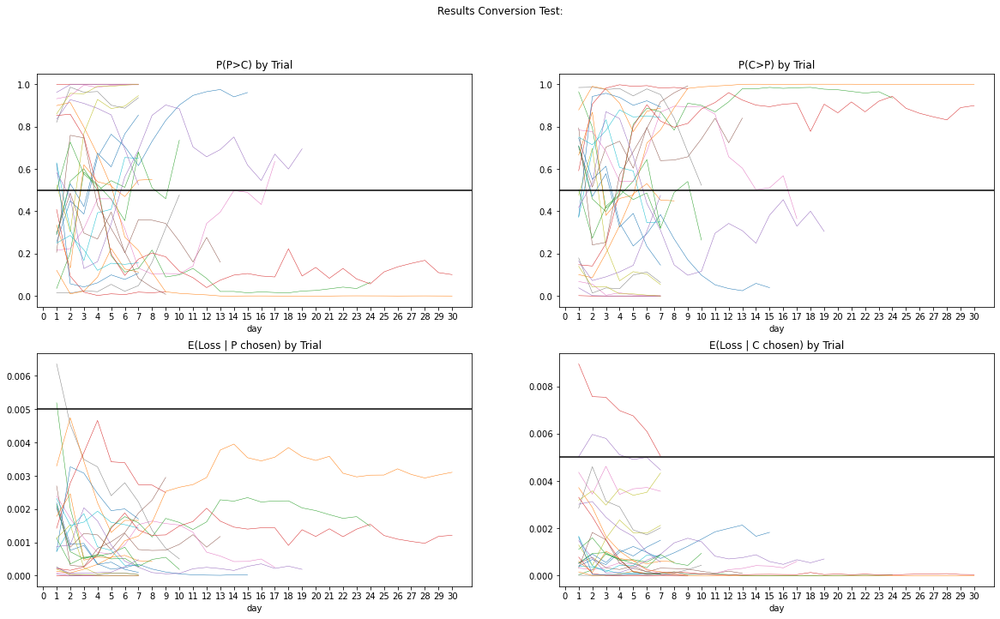

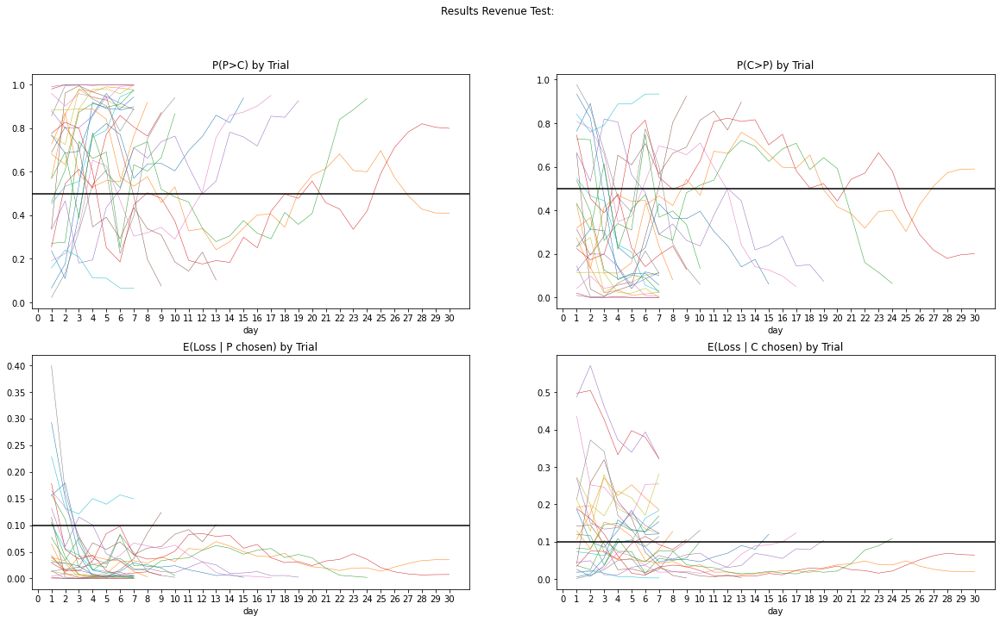

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,15,False,False,False,True,False
1,1,8,False,False,False,True,False
2,2,10,False,False,False,True,False
3,3,7,False,True,False,True,False
4,4,7,False,False,False,True,False
5,5,13,False,False,True,False,False
6,6,17,False,False,False,True,False
7,7,10,False,False,False,True,False
8,8,7,False,False,False,True,False
9,9,7,False,False,False,True,False


In [34]:
plot_results(unif_r_nU_yU_1[0], "Conversion", 0.005, unif_r_nU_yU_1[3])
plot_results(unif_r_nU_yU_1[1], "Revenue", 0.1, unif_r_nU_yU_1[3])
unif_r_nU_yU_1[2]

In [35]:
# No Uplift on Conversion:
# 10% Uplift on Revenue:
unif_r_nU_yU_2 = get_all(
    gen_type = "unif",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1,
    rev_multi = 1.1,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


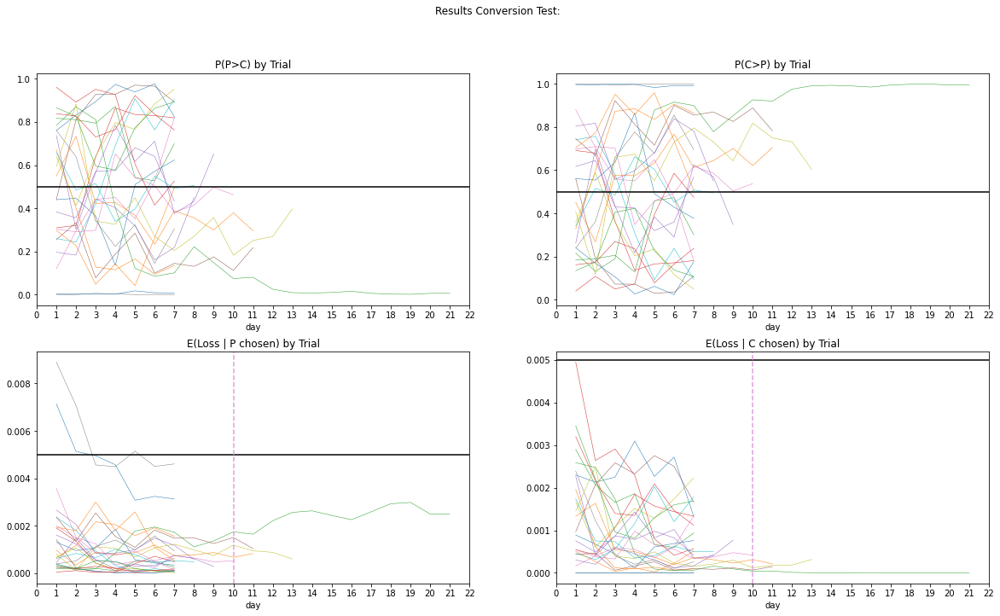

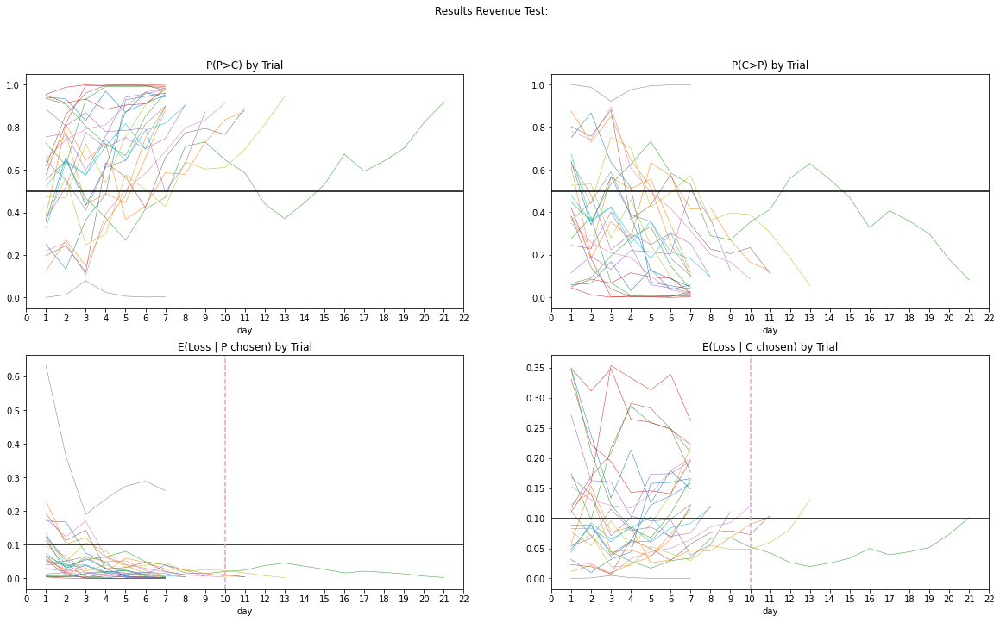

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,7,False,False,False,True,False
1,1,7,False,False,False,True,False
2,2,7,False,False,False,True,False
3,3,7,False,False,False,True,False
4,4,7,False,False,False,True,False
5,5,7,False,False,False,True,False
6,6,10,False,False,False,True,False
7,7,7,False,False,True,False,False
8,8,7,False,False,False,True,False
9,9,7,False,False,False,True,False


In [36]:
plot_results(unif_r_nU_yU_2[0], "Conversion", 0.005, unif_r_nU_yU_2[3])
plot_results(unif_r_nU_yU_2[1], "Revenue", 0.1, unif_r_nU_yU_2[3])
unif_r_nU_yU_2[2]

In [ ]:
# No Uplift on Conversion:
# 15% Uplift on Revenue:
unif_r_nU_yU_3 = get_all(
    gen_type = "unif",
    n_trials = 25,
    stop_rule_con = 0.005,
    stop_rule_rev = 0.1,
    n_days = 30,
    con_multi = 1,
    rev_multi = 1.15,
)

Trial 0/25
Trial 5/25
Trial 10/25
Trial 15/25
Trial 20/25


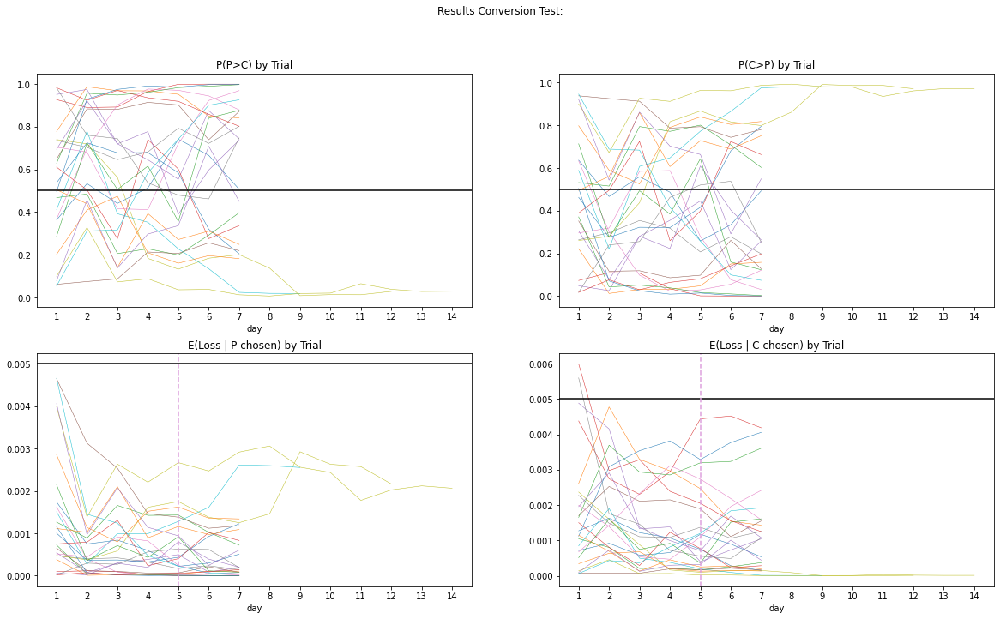

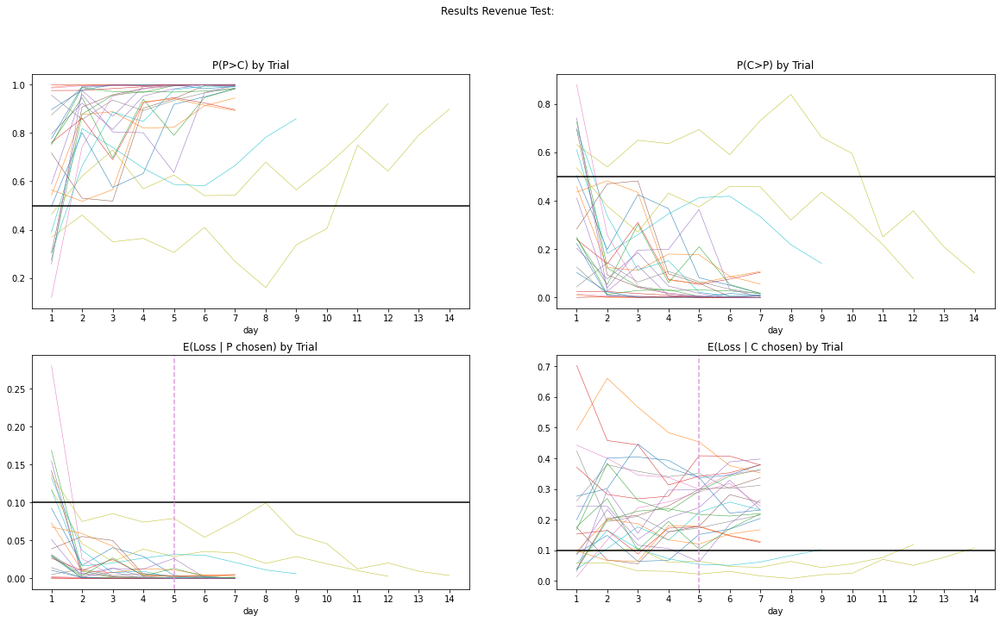

,trial,day,con_p,con_c,rev_p,rev_c,time
0,0,7,False,False,False,True,False
1,1,7,False,False,False,True,False
2,2,7,False,False,False,True,False
3,3,7,False,False,False,True,False
4,4,7,False,False,False,True,False
5,5,7,False,False,False,True,False
6,6,7,False,False,False,True,False
7,7,7,False,False,False,True,False
8,8,12,False,False,False,True,False
9,9,9,False,False,False,True,False


In [ ]:
plot_results(unif_r_nU_yU_3[0], "Conversion", 0.005, unif_r_nU_yU_3[3])
plot_results(unif_r_nU_yU_3[1], "Revenue", 0.1, unif_r_nU_yU_3[3])
unif_r_nU_yU_3[2]

# Extra: